#### Covid analysis 

In [6]:
import scanpy as sc
import numpy as np 
sc.settings.set_figure_params(dpi=150, frameon=False, facecolor='white')
import pandas as pd

In [7]:
adata = sc.read("../data/covid/covid_integrated_new_for_pub2.h5ad")

In [8]:
sc.pp.normalize_total(adata,key_added="scale_factors",exclude_highly_expressed=True,target_sum=1e4)

In [9]:
sc.pp.log1p(adata)

In [10]:
adata.obs["condition"].replace("nan","control",inplace=True)

In [11]:
covid = adata[adata.obs["study"] == 'COVID-19 (query)']
other = adata[adata.obs["study"] != 'COVID-19 (query)']

In [12]:
other.obs["condition2"] = other.obs["condition"] 

Trying to set attribute `.obs` of view, copying.


In [13]:
covid.obs["condition2"] = covid.obs["condition"]
covid.obs["condition2"].replace("control","control (query)",inplace=True)

Trying to set attribute `.obs` of view, copying.


In [14]:
covid.obs["donor"] = covid.obs["sample_new"]

In [15]:
covid.obs_names_make_unique()
other.obs_names_make_unique()

In [16]:
adata = covid.concatenate(other)

In [17]:
HCL = adata[adata.obs["study"] == "HCL"]
other = adata[adata.obs["study"] != "HCL"]

In [18]:
HCL = HCL[HCL.obs["sample"].isin(["AdultPeripheralBlood","AdultLung"])]

In [19]:
HCL.obs["tissue"] = HCL.obs["sample"] 

Trying to set attribute `.obs` of view, copying.


In [20]:
HCL.obs["tissue"].value_counts()

AdultPeripheralBlood    13435
AdultLung                9626
Name: tissue, dtype: int64

In [21]:
HCL.obs["tissue"].replace(["AdultPeripheralBlood","AdultLung"],["PBMCs","Lung"],inplace=True)

In [22]:
other.obs_names_make_unique()
HCL.obs_names_make_unique()

In [23]:
adata = HCL.concatenate(other)

In [24]:
adata.obs["tissue"].value_counts()

nan            161647
PBMCs           36338
Lung             9626
Bone_Marrow      9581
Name: tissue, dtype: int64

In [25]:
adata.obs["condition2"].replace("control","control (refrence)",inplace=True)
adata.obs["condition2"].replace("severe COVID-19","severe COVID-19 (query)",inplace=True)
adata.obs["condition2"].replace("moderate COVID-19","moderate COVID-19 (query)",inplace=True)

In [26]:
adata.obs["celltype"] = adata.obs["celltype"].astype("category")

In [27]:
old_ct = list(adata.obs["celltype"].cat.categories)

In [28]:
old_ct

['AT1',
 'AT2',
 'B cell',
 'CCR7+ T',
 'CD10+ B cells',
 'CD14+ Monocytes',
 'CD16+ Monocytes',
 'CD20+ B cells',
 'CD4+ T cells',
 'CD8+ T cells',
 'Ciliated',
 'DC_activated',
 'Dendritic cell',
 'Erythrocytes',
 'Erythroid progenitors',
 'HSPCs',
 'IGSF21+ Dendritic',
 'M2 Macrophage',
 'Macrophages',
 'Mast cells',
 'Megakaryocyte progenitors',
 'Megakaryocytes',
 'Monocyte progenitors',
 'Monocytes',
 'NK',
 'NKT cells',
 'Neutrophil',
 'Plasma',
 'Proliferating Macrophage',
 'Proliferating T',
 'Secretory',
 'Signaling Alveolar Epithelial Type 2',
 'T cell',
 'Treg',
 'Tregs',
 'innate T',
 'mDC',
 'pDC']

In [29]:
to_replace = ['AT1',
 'AT2',
 'B cell',
 'T',
 'CD10+ B cells',
 'CD14+ Monocytes',
 'CD16+ Monocytes',
 'CD20+ B cells',
 'CD4+ T cells',
 'CD8+ T cells',
 'Ciliated',
 'DC',
 'DC',
 'Erythrocytes',
 'Erythroid progenitors',
 'HSPCs',
 'DC',
 'Macrophages',
 'Macrophages',
 'Mast cells',
 'Megakaryocytes',
 'Megakaryocytes',
 'Monocytes',
 'Monocytes',
 'NK',
 'NKT cells',
 'Neutrophil',
 'Plasma',
 'Macrophages',
 'T',
 'Secretory',
 'AT2',
 'T',
 'T',
 'T',
 'T',
 'mDC',
 'pDC']


In [30]:
adata.obs["celltype"] = adata.obs["celltype"].astype("category")

In [31]:
adata.obs["celltype"].replace(old_ct,to_replace,inplace=True)

In [126]:
sc.settings.set_figure_params(dpi=150, frameon=False, facecolor='white')

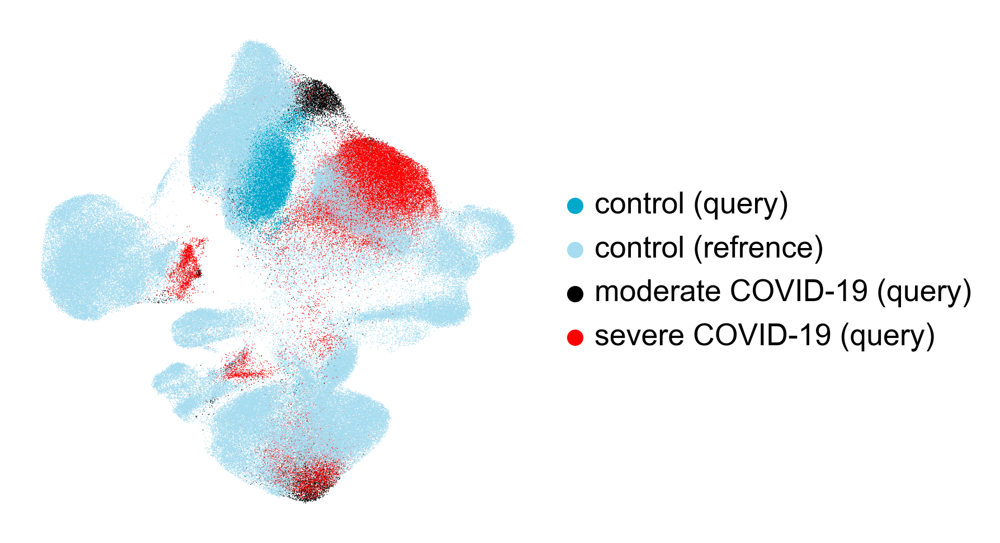

In [127]:
sc.pl.umap(adata, color=["condition2"], palette=["#00a8cc","#a6dcef","black","red"], save="_condition_covid_2.pdf", title="")

In [458]:
mayer = adata[adata.obs["study"] == "Sanger_Meyer_2019Madissoon"]
other = adata[adata.obs["study"] != "Sanger_Meyer_2019Madissoon"]

In [464]:
mayer.obs["ann_level_4"].value_counts()

CD4+ T cells       7211
Monocytes          6067
CD8+ T cells       5755
AT2                4676
Macrophages        4606
Mast cell          2911
Dendritic cells    1768
AT1                 764
Tregs               481
DC_activated        122
pDC                  46
Name: ann_level_4, dtype: int64

In [465]:
mayer.obs["celltype"].value_counts()

CD4+ T cells    7211
Monocytes       6067
CD8+ T cells    5755
AT2             4676
Macrophages     4606
Mast cells      2911
DC              1890
AT1              764
T                481
pDC               46
Name: celltype, dtype: int64

In [470]:
mayer.obs["celltype"].replace("T","Tregs",inplace=True)

In [472]:
mayer.obs["celltype"].value_counts()

CD4+ T cells    7211
Monocytes       6067
CD8+ T cells    5755
AT2             4676
Macrophages     4606
Mast cells      2911
DC              1890
AT1              764
Tregs            481
pDC               46
Name: celltype, dtype: int64

In [473]:
mayer.obs["celltype"].replace("T","Tregs",inplace=True)
mayer.obs_names_make_unique()
other.obs_names_make_unique()
adata = other.concatenate(mayer)

In [468]:
sc.settings.set_figure_params(dpi=150, frameon=False, facecolor='white')

... storing 'age_range' as categorical
... storing 'anatomical_region' as categorical
... storing 'dataset' as categorical
... storing 'donor' as categorical
... storing 'ethnicity' as categorical
... storing 'last_author/PI' as categorical
... storing 'lung_vs_nasal' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'pack_years' as categorical
... storing 'sample' as categorical
... storing 'sex' as categorical
... storing 'smoking' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'ann_new' as categorical
... storing 'subject_type' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'stage' as categorical
... storing '

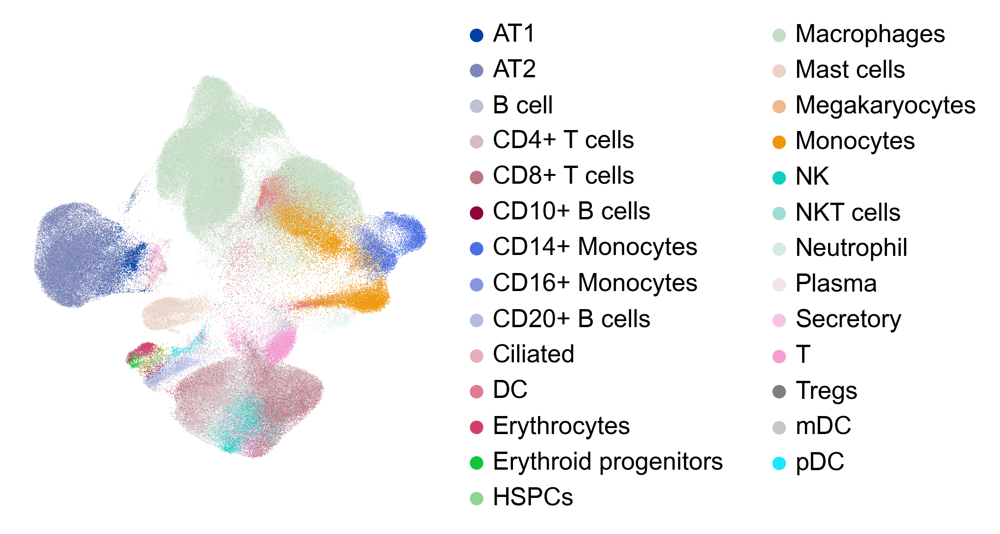

In [474]:
sc.pl.umap(adata, color=["celltype"], palette=sc.pl.palettes.default_28,title="", save="_cell_type_covid.pdf")

In [34]:
adata.obs["study2"].replace(['Oetjen_A', 'Oetjen_P', 'Oetjen_U','Sun_sample1_CS', 'Sun_sample2_KC', 'Sun_sample3_TB', 'Sun_sample4_TC'],
                           ['Oetjen', 'Oetjen', 'Oetjen','Sun', 'Sun', 'Sun', 'Sun'],inplace=True)

In [35]:
lung = adata[adata.obs["study2"].isin(["Northwestern_Misharin_2018Reyfman","Sanger_Meyer_2019Madissoon","Stanford_Krasnow_bioRxivTravaglini"])]
covid = adata[adata.obs["study2"].isin(["COVID-19"])]
other = adata[~adata.obs["study2"].isin(["COVID-19","Northwestern_Misharin_2018Reyfman","Sanger_Meyer_2019Madissoon","Stanford_Krasnow_bioRxivTravaglini"])]

In [36]:
covid.obs["celltype"].value_counts()

Macrophages     48734
T                3717
CD8+ T cells     2771
Neutrophil       1607
Secretory        1267
NK               1113
Plasma           1041
mDC               941
Ciliated          881
B cell            198
pDC               148
Mast cells         51
Name: celltype, dtype: int64

In [37]:
cell_types_covid = covid.obs["celltype"].unique()

In [38]:
covid.obs["tissue"] = ["BALF"] * len(covid)
lung.obs["tissue"] = ["Lung"] * len(lung)

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [39]:
covid.obs_names_make_unique()
lung.obs_names_make_unique()
other.obs_names_make_unique()
adata = other.concatenate(covid,lung)

In [40]:
import seaborn as sns

In [41]:
sns.color_palette("husl", 8)[3]

(0.19783576093349015, 0.6955516966063037, 0.3995301037444499)

... storing 'age_range' as categorical
... storing 'anatomical_region' as categorical
... storing 'dataset' as categorical
... storing 'donor' as categorical
... storing 'ethnicity' as categorical
... storing 'last_author/PI' as categorical
... storing 'lung_vs_nasal' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'pack_years' as categorical
... storing 'sample' as categorical
... storing 'sex' as categorical
... storing 'smoking' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'ann_new' as categorical
... storing 'subject_type' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'stage' as categorical
... storing '

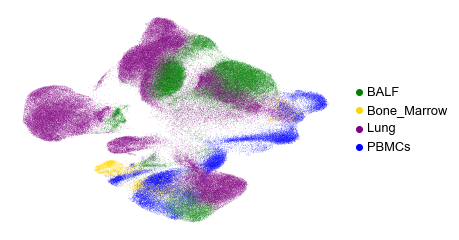

In [42]:
sc.pl.umap(adata, color=["tissue"], palette=["green","gold","purple", "blue"], save="_tissue_covid.pdf", title="")

In [43]:
adata.obs["study"].replace("COVID-19", "COVID-19 (query)", inplace=True)

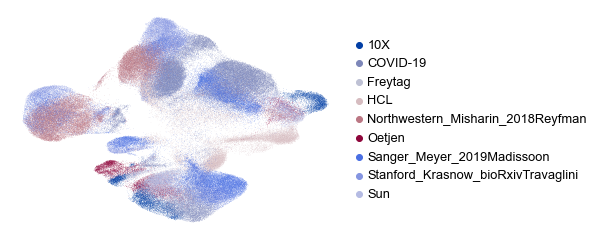

In [44]:
sc.pl.umap(adata, color=["study2"],palette=sc.pl.palettes.zeileis_28, save="_study_covid1.pdf", title="")

In [45]:
fraytag = adata[adata.obs["study2"] == "Freytag"]
Oetjen = adata[adata.obs["study2"] == "Oetjen"]
x = adata[adata.obs["study2"] == "10X"]
sun = adata[adata.obs["study2"] == "Sun"]

In [46]:
other = adata[~adata.obs["study2"].isin(["Freytag","Oetjen","10X","Sun"])]

In [47]:
fraytag.obs["donor"] = "Freytag_donor_1"
x.obs["donor"] = "10x_donor_1"
sun.obs["donor"] = sun.obs["study"]
Oetjen.obs["donor"] = Oetjen.obs["study"]

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [48]:
Oetjen.obs_names_make_unique()
x.obs_names_make_unique()
fraytag.obs_names_make_unique()
sun.obs_names_make_unique()
other.obs_names_make_unique()

In [49]:
adata = other.concatenate(fraytag,x,sun,Oetjen)

... storing 'age_range' as categorical
... storing 'anatomical_region' as categorical
... storing 'dataset' as categorical
... storing 'donor' as categorical
... storing 'ethnicity' as categorical
... storing 'last_author/PI' as categorical
... storing 'lung_vs_nasal' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'pack_years' as categorical
... storing 'sample' as categorical
... storing 'sex' as categorical
... storing 'smoking' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'ann_new' as categorical
... storing 'subject_type' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'stage' as categorical
... storing '

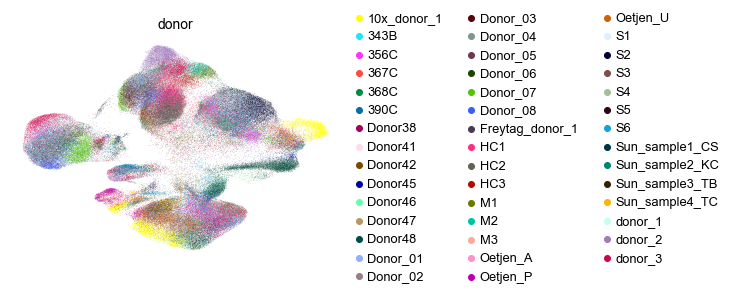

In [50]:
sc.pl.umap(adata, color=["donor"],save="_donor.pdf")

In [52]:
adata.obs["celltype"].cat.remove_unused_categories(inplace=True)

In [486]:
sc.settings.set_figure_params(dpi=100, frameon=False, facecolor='white')
t_groups = ["T","CD8+ T cells","CD4+ T cells","Tregs"]

In [487]:
t = adata[adata.obs["celltype"].isin(t_groups)]

In [488]:
sc.pp.neighbors(t,use_rep="latent")
sc.tl.umap(t)

/home/mohammad/anaconda3/envs/tf/lib/python3.6/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../anaconda3/envs/tf/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


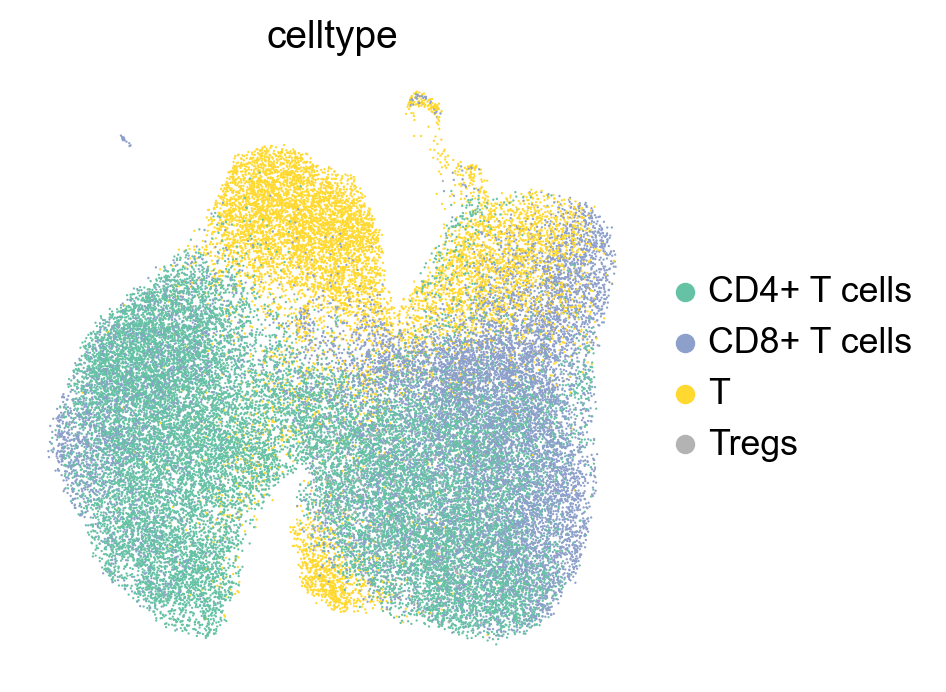

In [508]:
sc.pl.umap(t, color=["celltype"],
           palette="Set2",save="celltype_t_Cell.pdf")

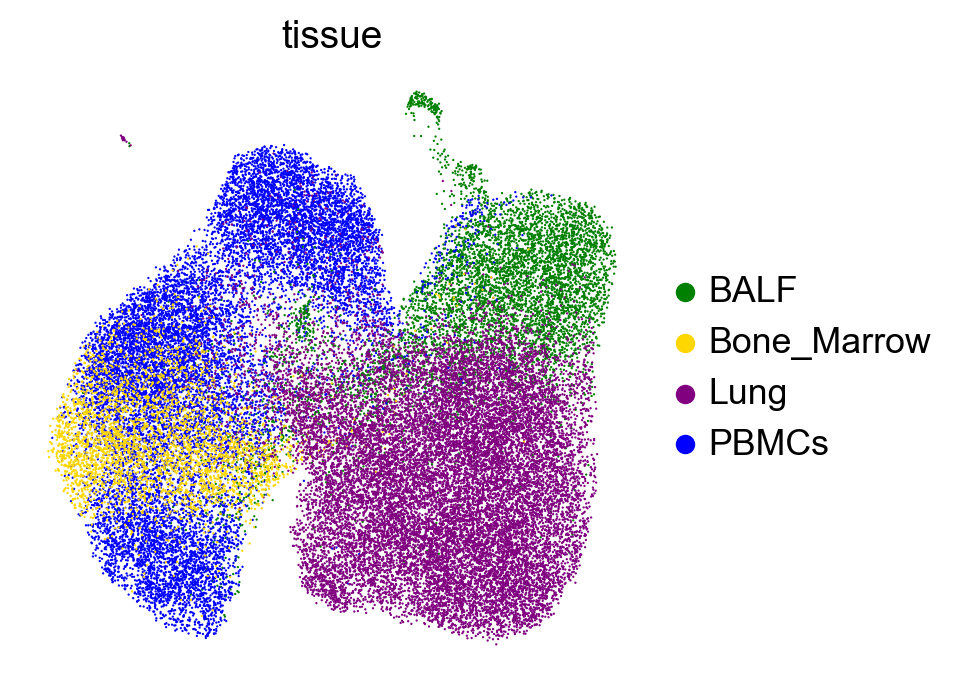

In [506]:
sc.pl.umap(t, color=["tissue"],
           palette=["green","gold","purple", "blue"],
          save="tcell_tissue.pdf")

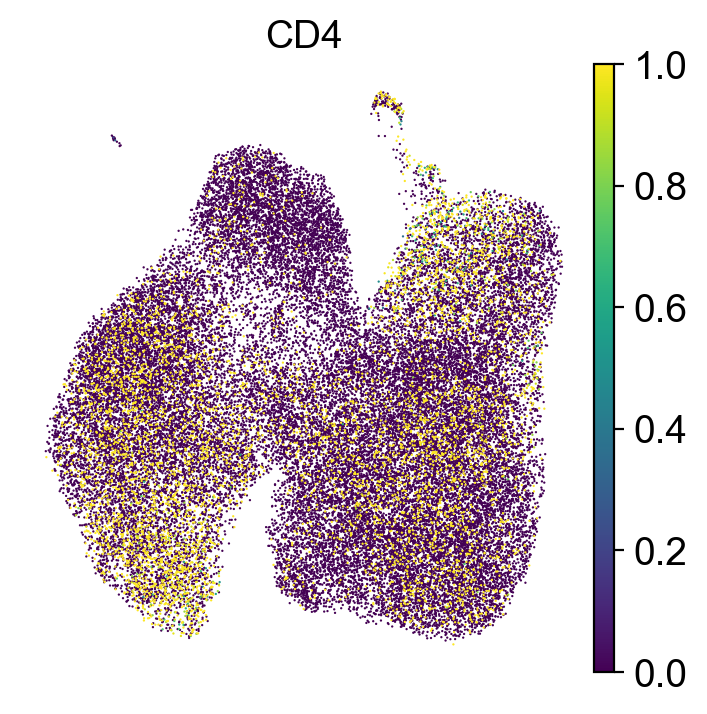

In [504]:
sc.pl.umap(t, color=["CD4"],vmax=1,save="tcell_cd4t.pdf")

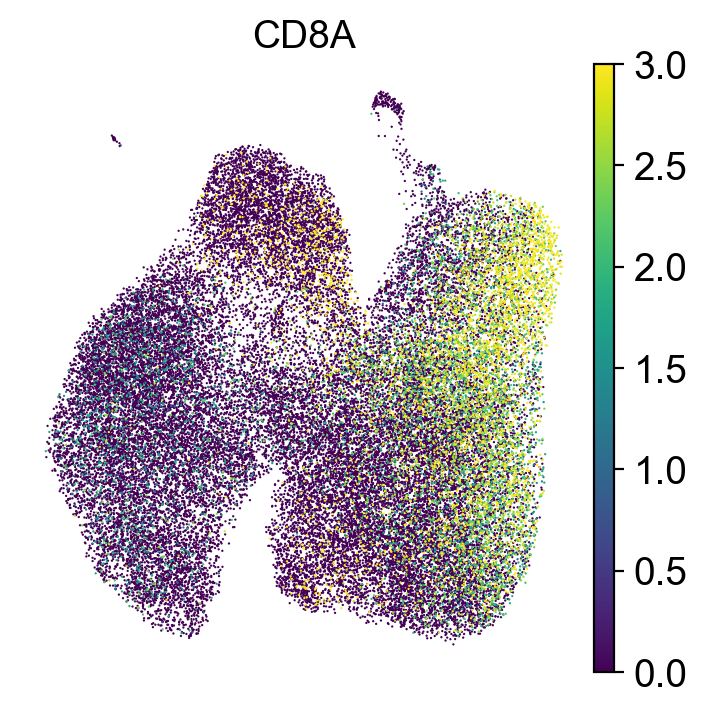

In [503]:
sc.pl.umap(t, color=["CD8A"],vmax=3,save="tcell_cd8a.pdf")

In [493]:
t.obs["study"].value_counts()

Sanger_Meyer_2019Madissoon    13447
COVID-19 (query)               6488
HCL                            5866
10X                            3287
Krasnow_distal 3               2380
Oetjen_U                       1905
Freytag                        1508
Sun_sample3_TB                 1406
Sun_sample2_KC                 1238
Sun_sample4_TC                 1192
Sun_sample1_CS                 1054
Oetjen_P                        934
Krasnow_distal 2                910
Oetjen_A                        670
Krasnow_medial 2                600
Krasnow_distal 1a               532
Krasnow_proximal 3              467
Name: study, dtype: int64

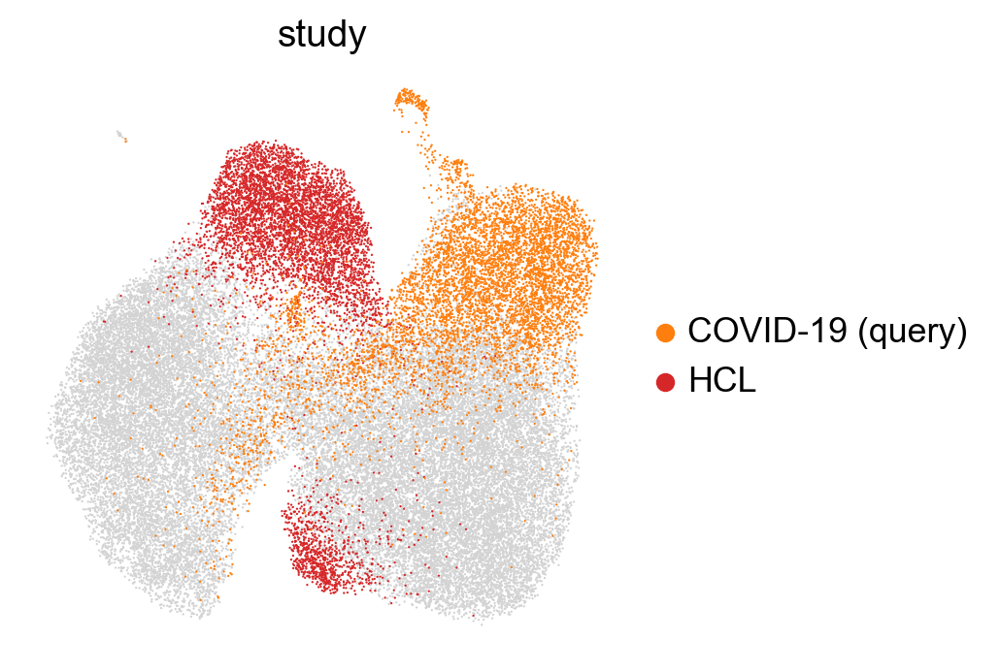

In [497]:
sc.pl.umap(t, color=["study"],groups=["COVID-19 (query)","HCL"], save="tcell_study_hclcovid")

In [501]:
t_only = t[t.obs["celltype"] == "T"]

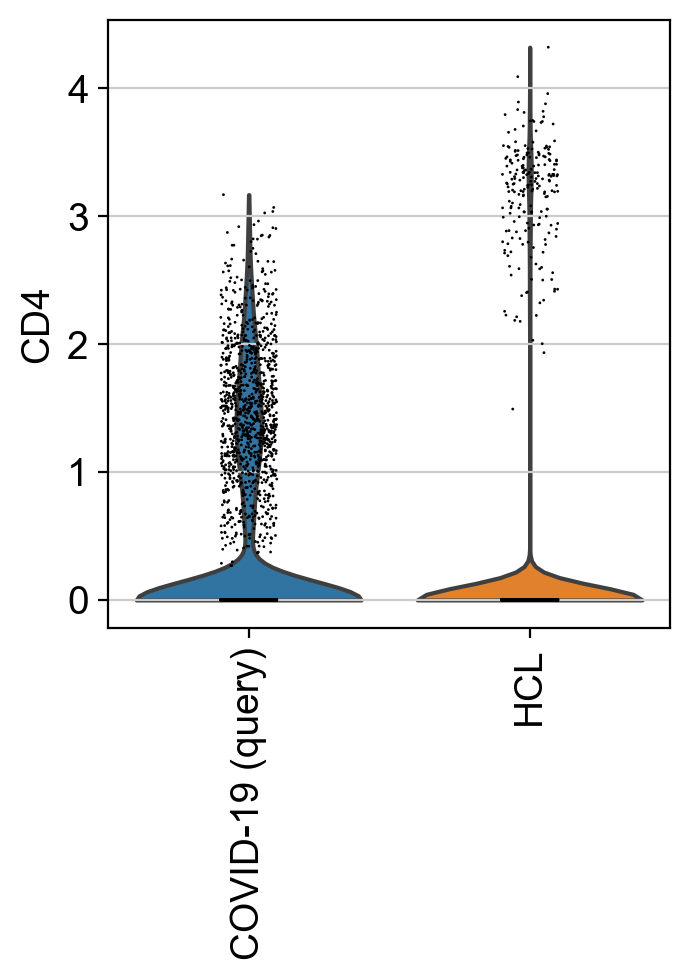

In [509]:
sc.pl.violin(t_only,keys=["CD4"],
             groupby="study",rotation=90,
            save="t.pdf")

In [447]:
t_only.obs["ann_level_4"]

109440-0-0-1-1-0-0-0                                        nan
109753-0-0-1-1-0-0-0                                        nan
110039-0-0-1-1-0-0-0                                        nan
110040-0-0-1-1-0-0-0                                        nan
110173-0-0-1-1-0-0-0                                        nan
                                                          ...  
TTAGGCACATAGAAAC-1-HCATisStab7646034_Meyer-1-0-1-1-2-0    Tregs
GATGAAAGTCCAGTTA-1-HCATisStab7646032_Meyer-1-0-1-1-2-0    Tregs
TTTGCGCGTAGCTTGT-1-HCATisStab7659969_Meyer-1-0-1-1-2-0    Tregs
CAGCATACATTACCTT-1-HCATisStab7646034_Meyer-1-0-1-1-2-0    Tregs
TTTGGTTAGCCAGTTT-1-HCATisStab7646033_Meyer-1-0-1-1-2-0    Tregs
Name: ann_level_4, Length: 10064, dtype: category
Categories (2, object): [Tregs, nan]

In [453]:
sc.settings.set_figure_params(dpi=70, frameon=False, facecolor='white')


In [477]:
temp2 = adata[:,0]

In [478]:
t_groups = ["T","CD8+ T cells","CD4+ T cells","Tregs"]
nk_groups = ["NKT cells","NK"]
mono_group = ["CD14+ Monocytes","Macrophages","CD16+ Monocytes","Monocytes","Neutrophil"]
dc = ["DC","mDC"]
eryth = ["Erythrocytes","Erythroid progenitors","Megakaryocytes"]
blood = ["Plasma","B cell","CD20+ B cells","CD10+ B cells","pDC"]
epithelial = ["Secretory","AT2","AT1","Ciliated"]
must = ["Mast cells"]

In [317]:
sc.settings.set_figure_params(dpi=100, frameon=False, facecolor='white')


... storing 'dataset' as categorical
... storing 'donor' as categorical
... storing 'ethnicity' as categorical
... storing 'last_author/PI' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'sample' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'ann_new' as categorical
... storing 'subject_type' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'ID' as categorical
... storing 'final_annotation' as categorical


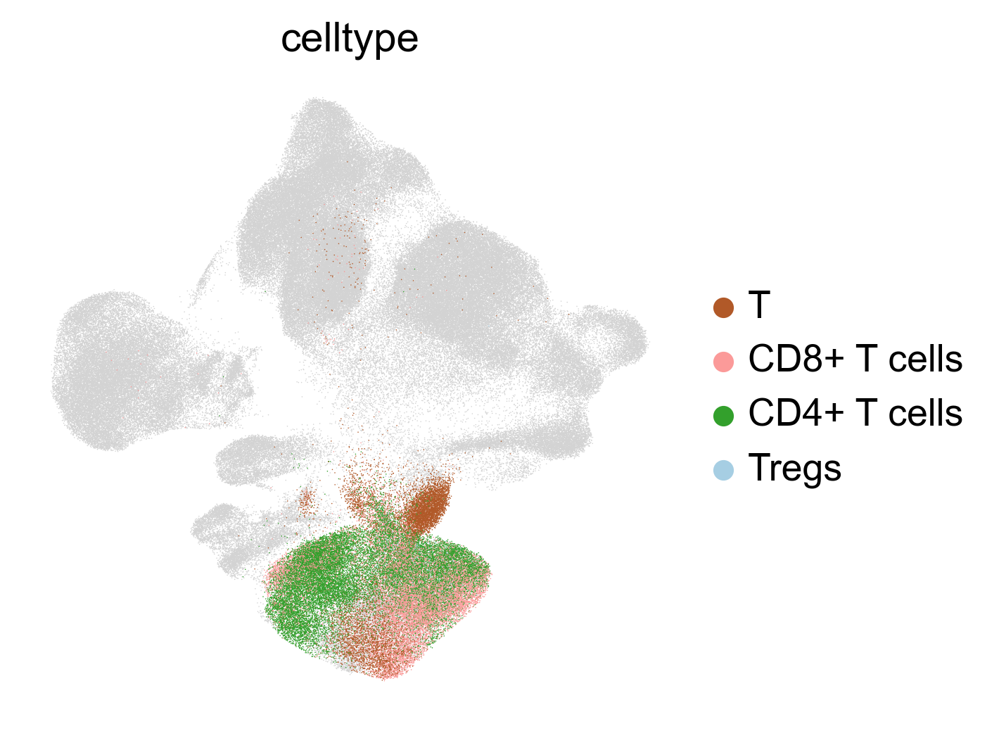

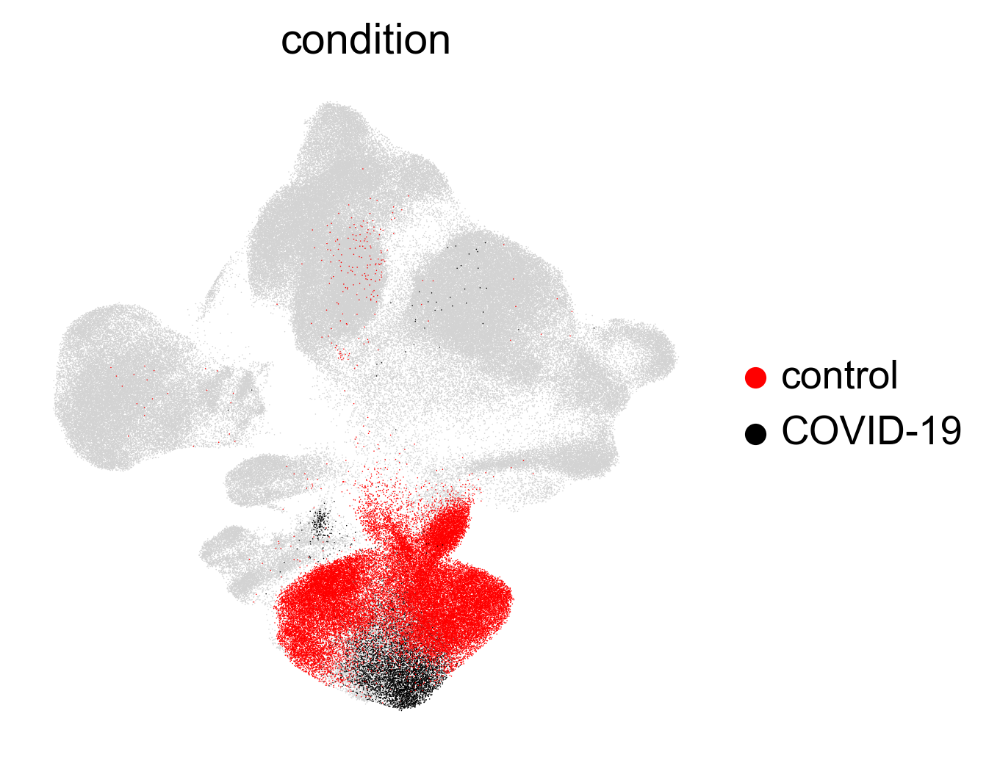

In [479]:
t = temp2[temp2.obs["celltype"].isin(t_groups)]
other = temp2[~temp2.obs["celltype"].isin(t_groups)]
other_c = list(other.obs["condition"].unique())
t.obs_names_make_unique()
other.obs_names_make_unique()
t.obs["condition"].replace(["control","severe COVID-19","moderate COVID-19"],["control","COVID-19","COVID-19"],inplace=True)
other.obs["condition"].replace(other_c,len(other_c)*["other"],inplace=True)
temp3 = other.concatenate(t)
sc.pl.umap(temp3, color="celltype",groups=t_groups, palette=sns.color_palette("Paired",27),save="_ct_t_group.pdf")
sc.pl.umap(temp3, color="condition",groups=["control","COVID-19"],palette=["black","red"],save="_cnd_t_group.pdf")

... storing 'age_range' as categorical
... storing 'anatomical_region' as categorical
... storing 'dataset' as categorical
... storing 'donor' as categorical
... storing 'ethnicity' as categorical
... storing 'last_author/PI' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'pack_years' as categorical
... storing 'sample' as categorical
... storing 'smoking' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'ann_new' as categorical
... storing 'subject_type' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'stage' as categorical
... storing 'ID' as categorical
... storing 'final_annotation' as categorical


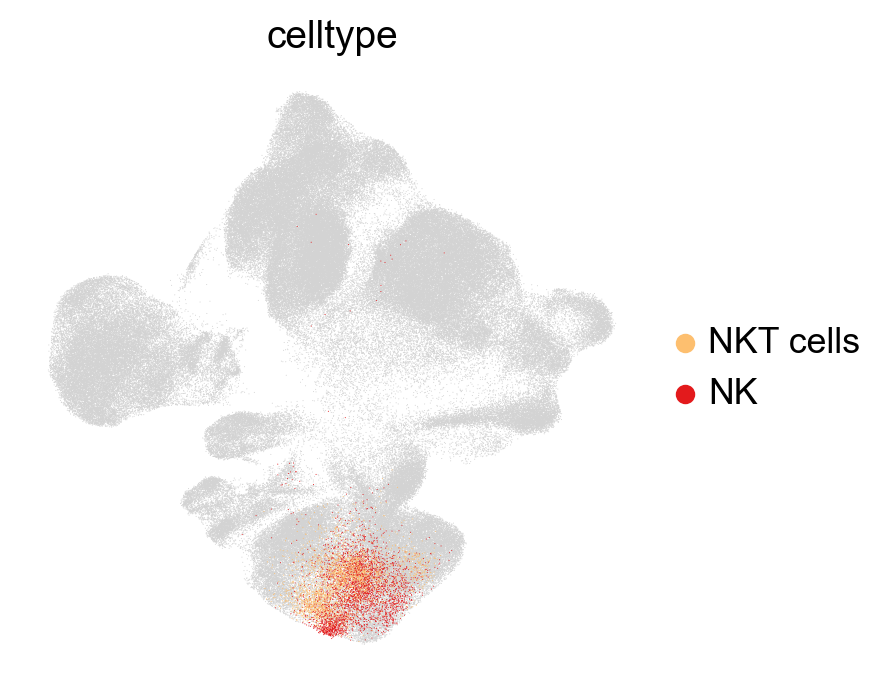

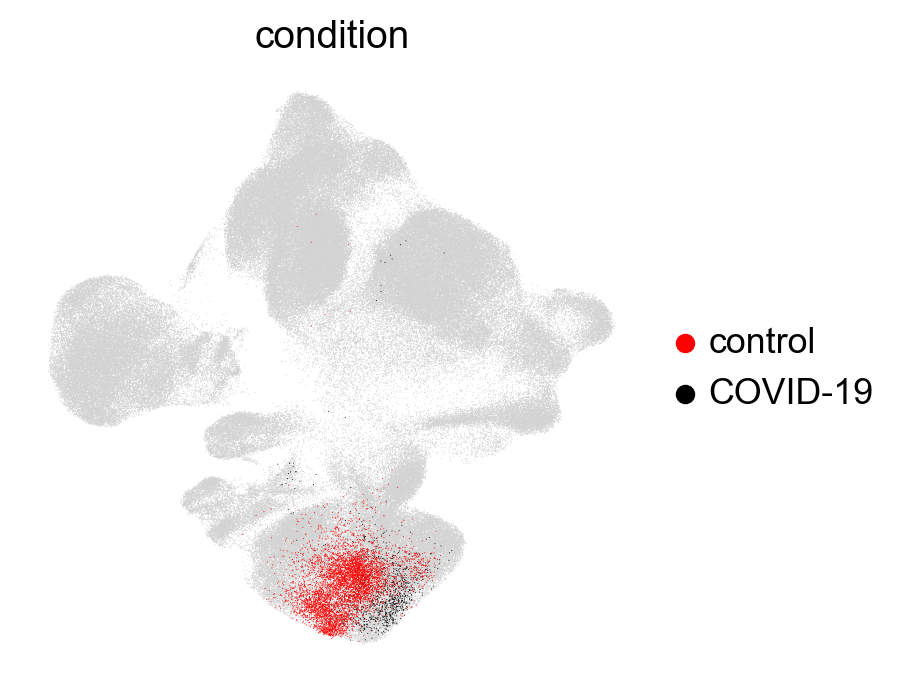

In [319]:
t = temp2[temp2.obs["celltype"].isin(nk_groups)]
other = temp2[~temp2.obs["celltype"].isin(nk_groups)]
other_c = list(other.obs["condition"].unique())
t.obs_names_make_unique()
other.obs_names_make_unique()
t.obs["condition"].replace(["control","severe COVID-19","moderate COVID-19"],["control","COVID-19","COVID-19"],inplace=True)
other.obs["condition"].replace(other_c,len(other_c)*["other"],inplace=True)
temp3 = other.concatenate(t)
sc.pl.umap(temp3, color="celltype",groups=nk_groups, palette=sns.color_palette("Paired",27)[5:7],save="_ct_nk_group.pdf")
sc.pl.umap(temp3, color="condition",groups=["control","COVID-19"],palette=["black","red"],save="_cnd_nk_group.pdf")

... storing 'original_celltype_ann' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'ID' as categorical
... storing 'final_annotation' as categorical


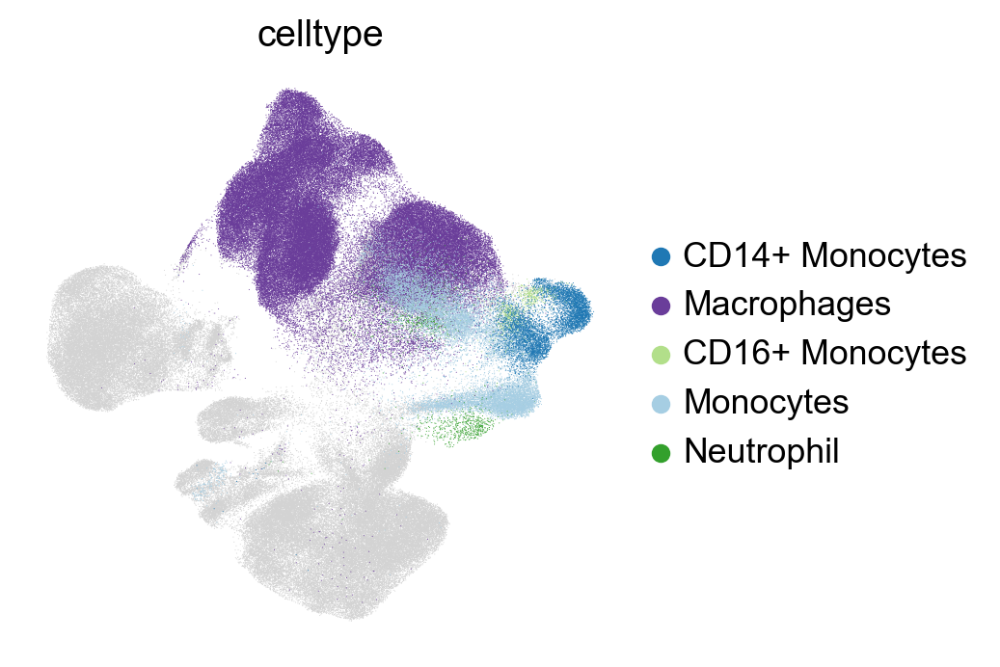

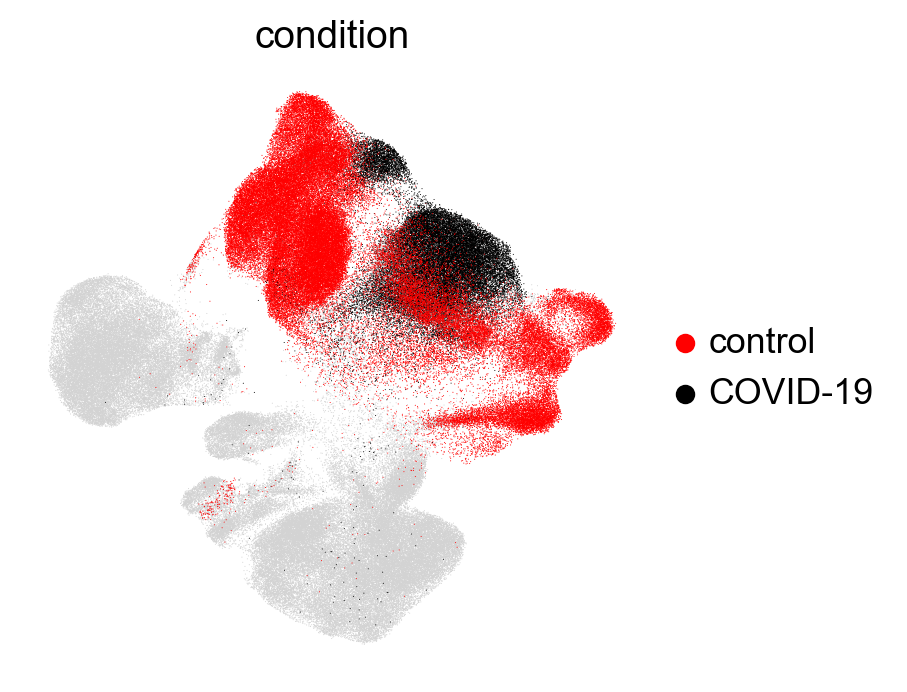

In [337]:
t = temp2[temp2.obs["celltype"].isin(mono_group)]
other = temp2[~temp2.obs["celltype"].isin(mono_group)]
other_c = list(other.obs["condition"].unique())
t.obs_names_make_unique()
other.obs_names_make_unique()
t.obs["condition"].replace(["control","severe COVID-19","moderate COVID-19"],["control","COVID-19","COVID-19"],inplace=True)
other.obs["condition"].replace(other_c,len(other_c)*["other"],inplace=True)
temp3 = other.concatenate(t)
sc.pl.umap(temp3, color="celltype",groups=mono_group, palette=sns.color_palette("Paired",27)[7:19],save="_ct_mono_group_group.pdf")
sc.pl.umap(temp3, color="condition",groups=["control","COVID-19"],palette=["black","red"],save="_cnd_mono_group_group.pdf")

... storing 'donor' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'ID' as categorical
... storing 'final_annotation' as categorical
... storing 'sample_ID' as categorical


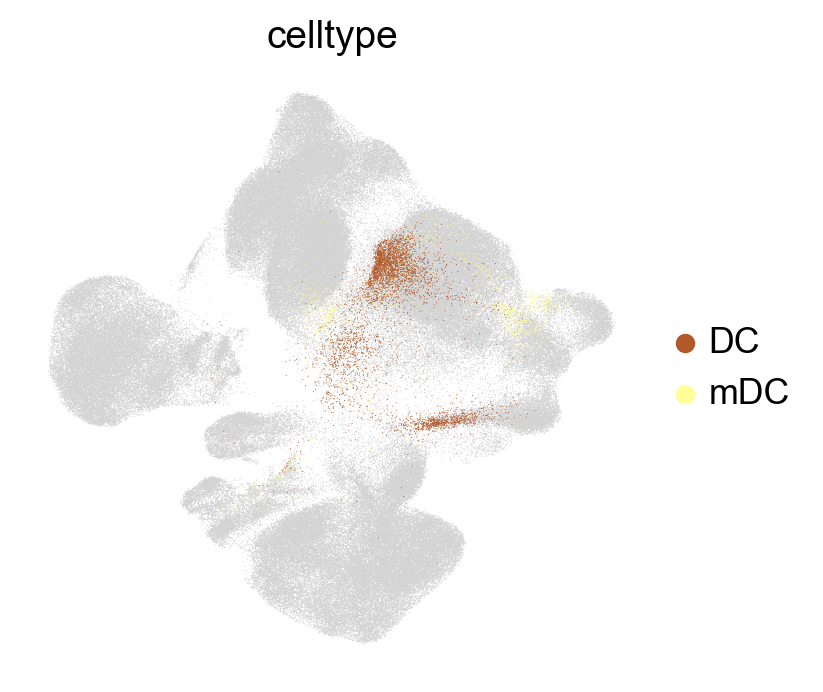

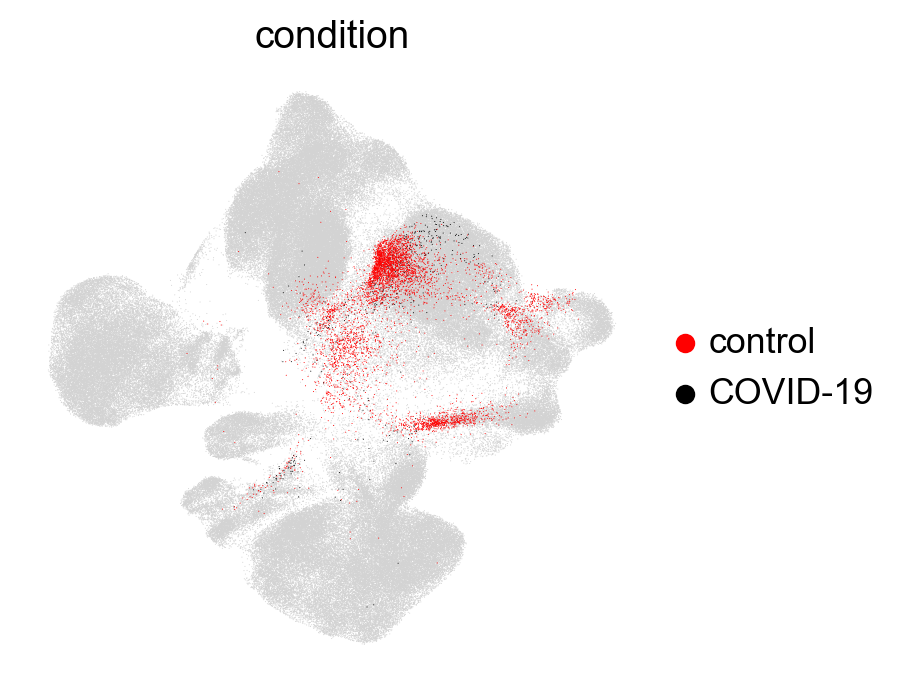

In [338]:
t = temp2[temp2.obs["celltype"].isin(dc)]
other = temp2[~temp2.obs["celltype"].isin(dc)]
other_c = list(other.obs["condition"].unique())
t.obs_names_make_unique()
other.obs_names_make_unique()
t.obs["condition"].replace(["control","severe COVID-19","moderate COVID-19"],["control","COVID-19","COVID-19"],inplace=True)
other.obs["condition"].replace(other_c,len(other_c)*["other"],inplace=True)
temp3 = other.concatenate(t)
sc.pl.umap(temp3, color="celltype",groups=dc, palette=sns.color_palette("Paired",27)[22:25],save="_ct_dc_group.pdf")
sc.pl.umap(temp3, color="condition",groups=["control","COVID-19"],palette=["black","red"],save="_cnd_dc_group_group.pdf")

... storing 'age_range' as categorical
... storing 'anatomical_region' as categorical
... storing 'dataset' as categorical
... storing 'donor' as categorical
... storing 'ethnicity' as categorical
... storing 'last_author/PI' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'pack_years' as categorical
... storing 'sample' as categorical
... storing 'smoking' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'ann_new' as categorical
... storing 'subject_type' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'stage' as categorical
... storing 'ID' as categorical
... storing 'sample_new' as categorical
... storing 'fina

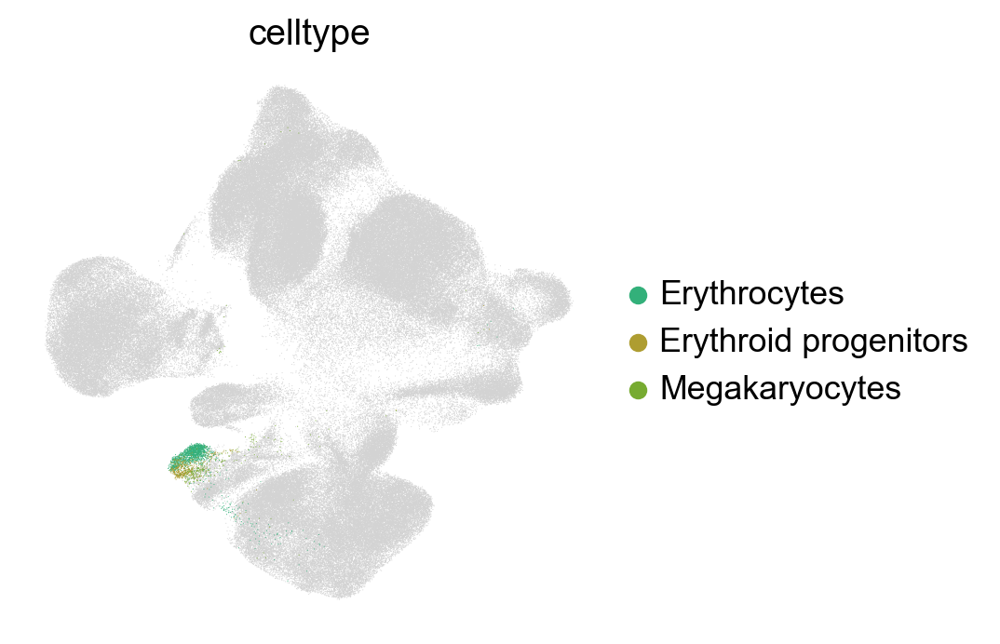

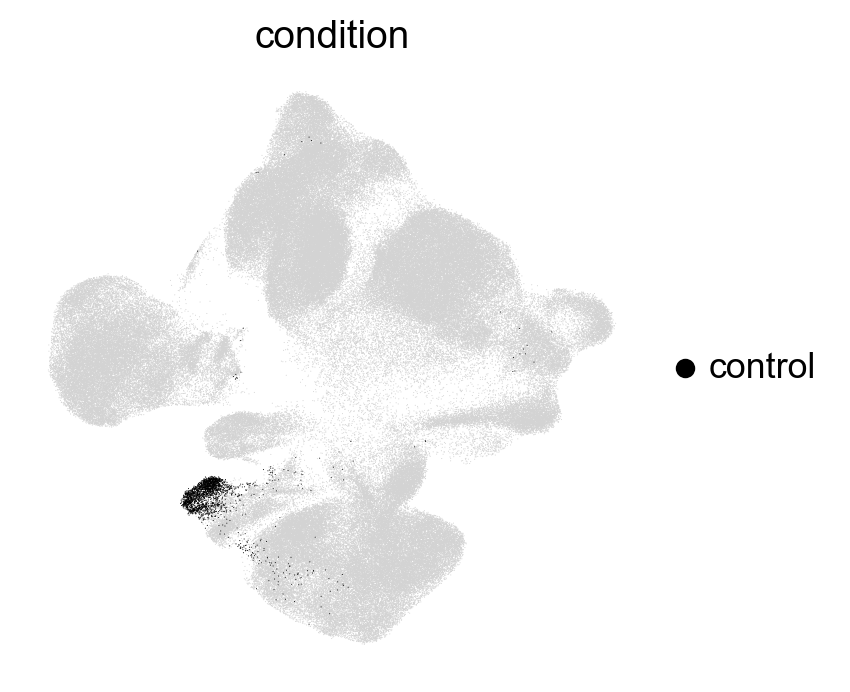

In [343]:
t = temp2[temp2.obs["celltype"].isin(eryth)]
other = temp2[~temp2.obs["celltype"].isin(eryth)]
other_c = list(other.obs["condition"].unique())
t.obs_names_make_unique()
other.obs_names_make_unique()
t.obs["condition"].replace(["control","severe COVID-19","moderate COVID-19"],["control","COVID-19","COVID-19"],inplace=True)
other.obs["condition"].replace(other_c,len(other_c)*["other"],inplace=True)
temp3 = other.concatenate(t)
sc.pl.umap(temp3, color="celltype",groups=eryth, palette=sns.color_palette("husl",10)[2:5],save="_ct_eryth_group.pdf")
if "COVID-19" in temp3.obs["condition"].unique():
    sc.pl.umap(temp3, color="condition",groups=["control","COVID-19"],palette=["black","red"],save="_cnd_eryth_group_group.pdf")
else:
    sc.pl.umap(temp3, color="condition",groups=["control"],palette=["black","red"],save="_cnd_eryth_group_group.pdf")

    

... storing 'dataset' as categorical
... storing 'donor' as categorical
... storing 'ethnicity' as categorical
... storing 'last_author/PI' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'sample' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'ann_new' as categorical
... storing 'subject_type' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'ID' as categorical
... storing 'final_annotation' as categorical


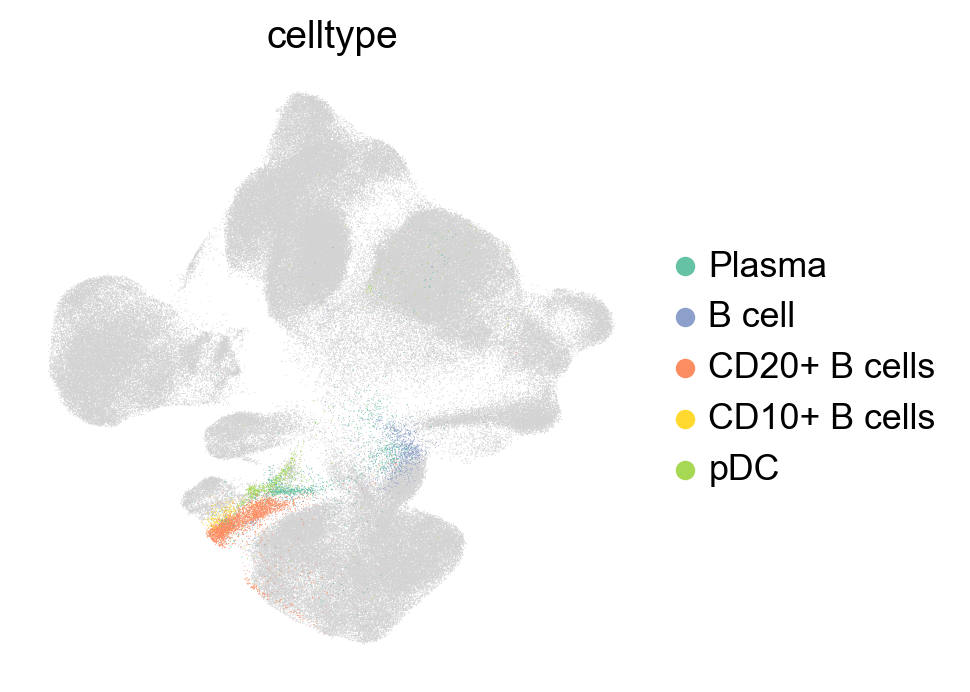

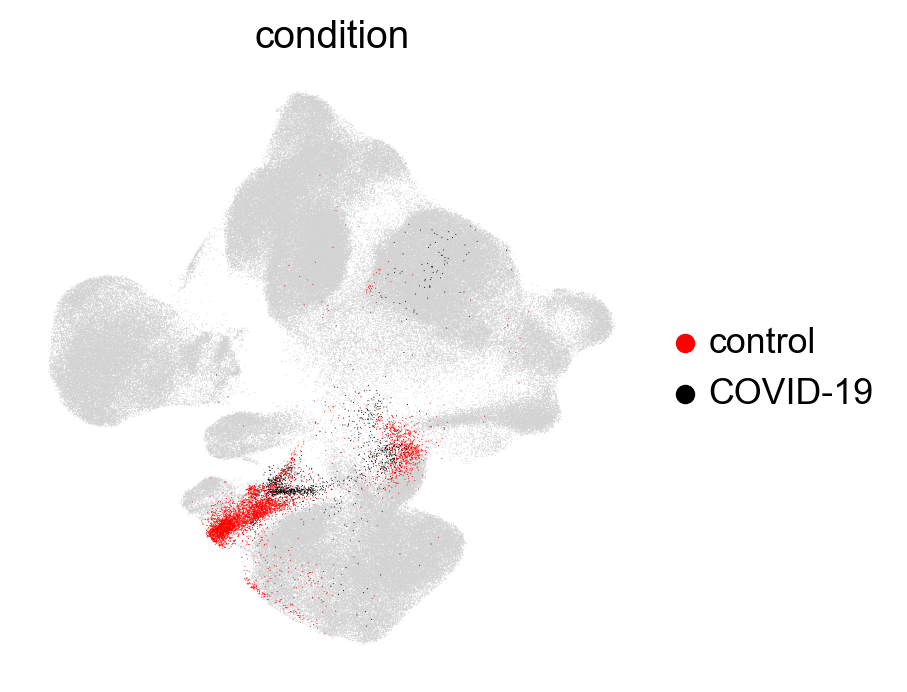

In [347]:
t = temp2[temp2.obs["celltype"].isin(blood)]
other = temp2[~temp2.obs["celltype"].isin(blood)]
other_c = list(other.obs["condition"].unique())
t.obs_names_make_unique()
other.obs_names_make_unique()
t.obs["condition"].replace(["control","severe COVID-19","moderate COVID-19"],["control","COVID-19","COVID-19"],inplace=True)
other.obs["condition"].replace(other_c,len(other_c)*["other"],inplace=True)
temp3 = other.concatenate(t)
sc.pl.umap(temp3, color="celltype",groups=blood, palette=sns.color_palette("Set2",20)[8:15],save="_ct_blood_group.pdf")
if "COVID-19" in temp3.obs["condition"].unique():
    sc.pl.umap(temp3, color="condition",groups=["control","COVID-19"],palette=["black","red"],save="_cnd_blood_group_group.pdf")
else:
    sc.pl.umap(temp3, color="condition",groups=["control"],palette=["black","red"],save="_cnd_blood_group_group.pdf")

    

... storing 'donor' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'sample' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'stage' as categorical
... storing 'ID' as categorical
... storing 'chemistry' as categorical
... storing 'data_type' as categorical
... storing 'final_annotation' as categorical
... storing 'sample_ID' as categorical
... storing 'species' as categorical
... storing 'tissue' as categorical


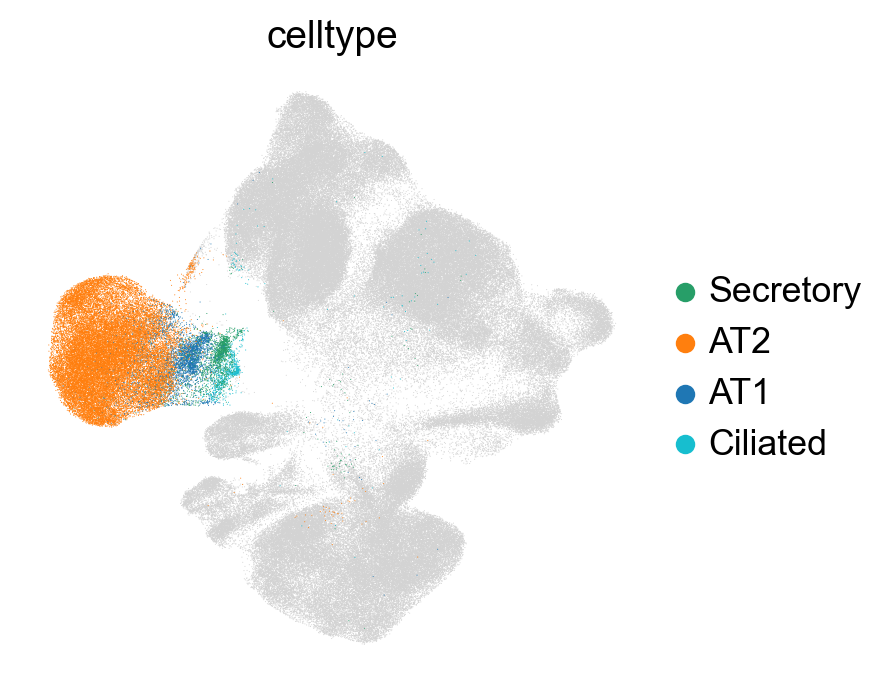

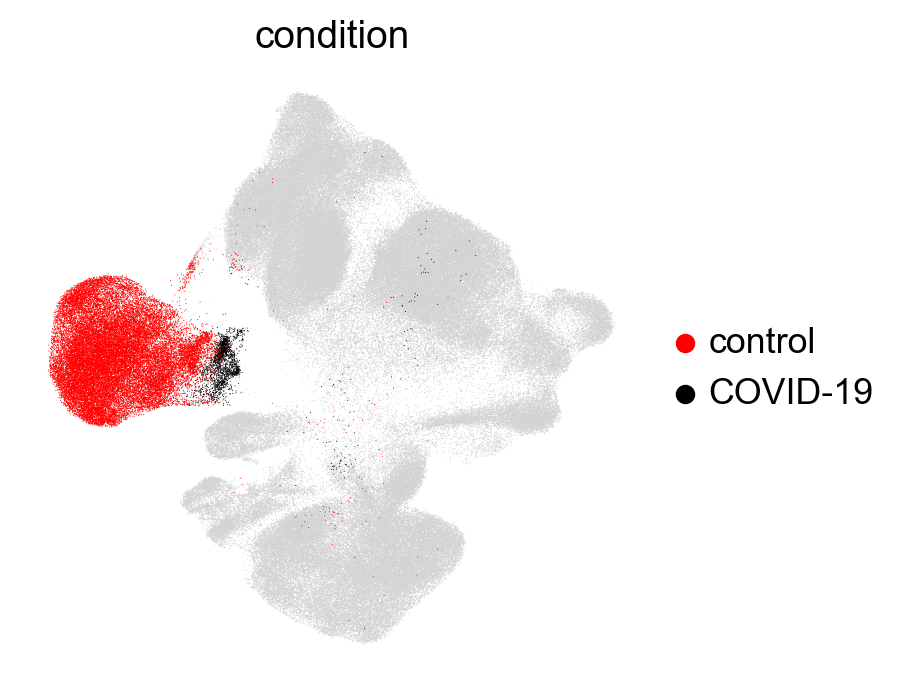

In [352]:
t = temp2[temp2.obs["celltype"].isin(epithelial)]
other = temp2[~temp2.obs["celltype"].isin(epithelial)]
other_c = list(other.obs["condition"].unique())
t.obs_names_make_unique()
other.obs_names_make_unique()
t.obs["condition"].replace(["control","severe COVID-19","moderate COVID-19"],["control","COVID-19","COVID-19"],inplace=True)
other.obs["condition"].replace(other_c,len(other_c)*["other"],inplace=True)
temp3 = other.concatenate(t)
sc.pl.umap(temp3, color="celltype",groups=epithelial, palette=sc.pl.palettes.vega_10_scanpy,save="_ct_epithelial_group.pdf")
if "COVID-19" in temp3.obs["condition"].unique():
    sc.pl.umap(temp3, color="condition",groups=["control","COVID-19"],palette=["black","red"],save="_cnd_epithelial_group_group.pdf")
else:
    sc.pl.umap(temp3, color="condition",groups=["control"],palette=["black","red"],save="_cnd_epithelial_group_group.pdf")

    

... storing 'donor' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'sample' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'ann_new' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'ID' as categorical
... storing 'sample_new' as categorical
... storing 'chemistry' as categorical
... storing 'data_type' as categorical
... storing 'final_annotation' as categorical
... storing 'sample_ID' as categorical
... storing 'species' as categorical
... storing 'tissue' as categorical


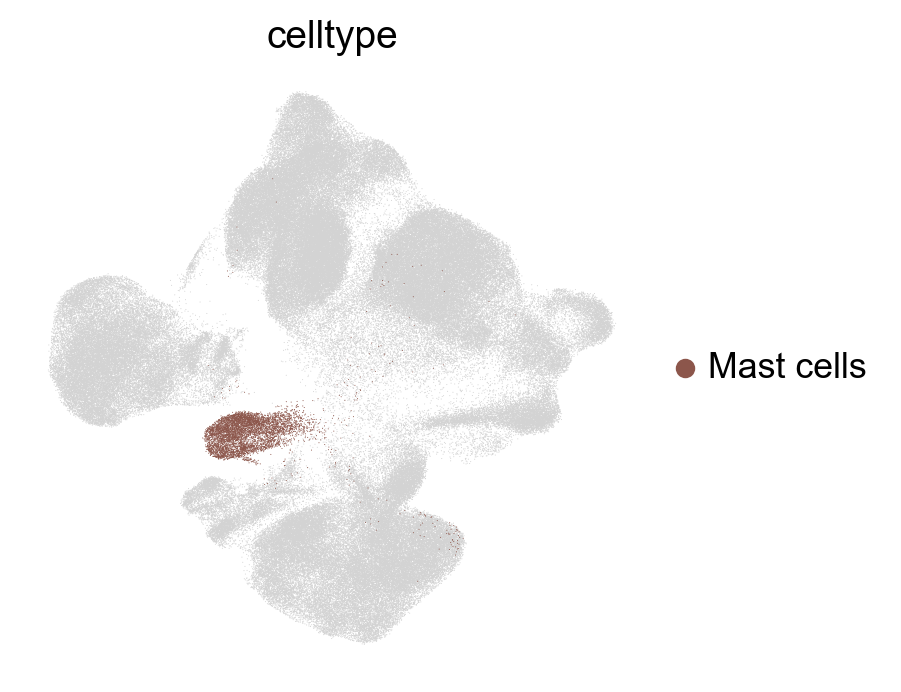

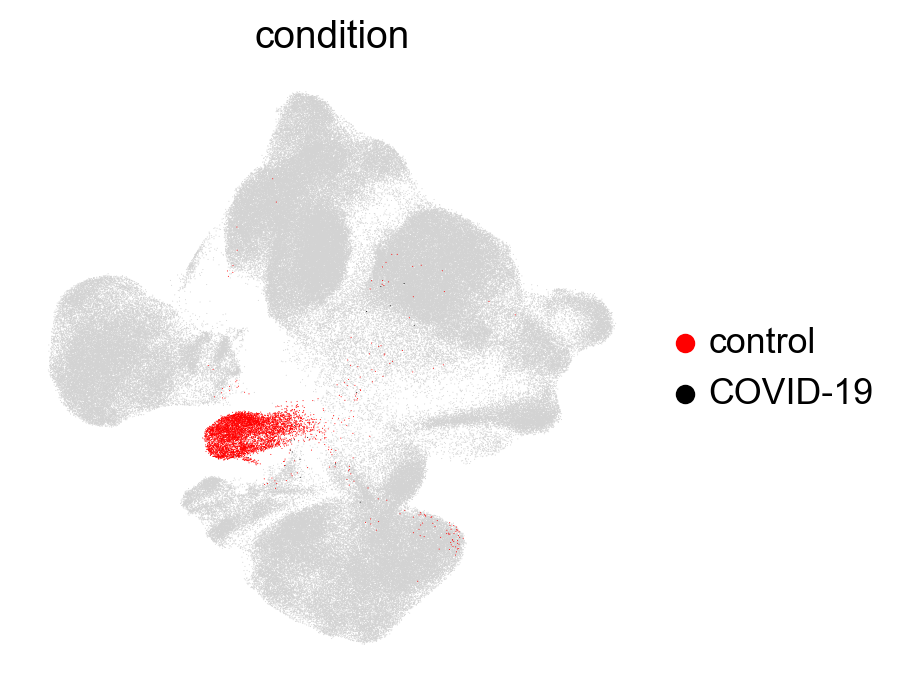

In [353]:
t = temp2[temp2.obs["celltype"].isin(must)]
other = temp2[~temp2.obs["celltype"].isin(must)]
other_c = list(other.obs["condition"].unique())
t.obs_names_make_unique()
other.obs_names_make_unique()
t.obs["condition"].replace(["control","severe COVID-19","moderate COVID-19"],["control","COVID-19","COVID-19"],inplace=True)
other.obs["condition"].replace(other_c,len(other_c)*["other"],inplace=True)
temp3 = other.concatenate(t)
sc.pl.umap(temp3, color="celltype",groups=must, palette=sc.pl.palettes.vega_10_scanpy,save="_ct_must_group.pdf")
if "COVID-19" in temp3.obs["condition"].unique():
    sc.pl.umap(temp3, color="condition",groups=["control","COVID-19"],palette=["black","red"],save="_cnd_must_group_group.pdf")
else:
    sc.pl.umap(temp3, color="condition",groups=["control"],palette=["black","red"],save="_cnd_must_group_group.pdf")

    

... storing 'age_range' as categorical
... storing 'anatomical_region' as categorical
... storing 'dataset' as categorical
... storing 'donor' as categorical
... storing 'ethnicity' as categorical
... storing 'last_author/PI' as categorical
... storing 'lung_vs_nasal' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'pack_years' as categorical
... storing 'sample' as categorical
... storing 'sex' as categorical
... storing 'smoking' as categorical
... storing 'ann_level_1' as categorical
... storing 'ann_level_2' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'ann_new' as categorical
... storing 'subject_type' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'stage' as categorical
... storing '

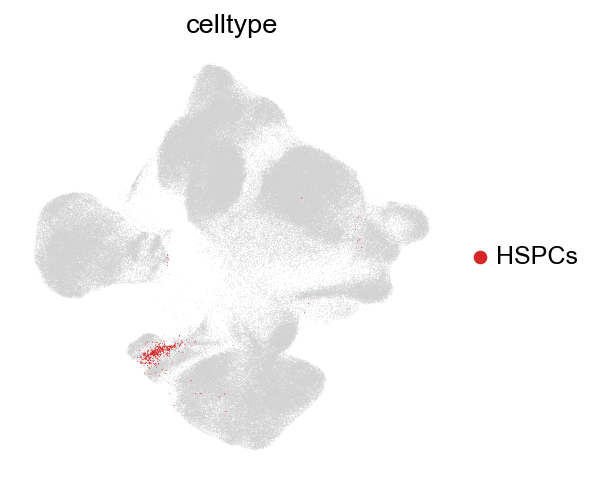

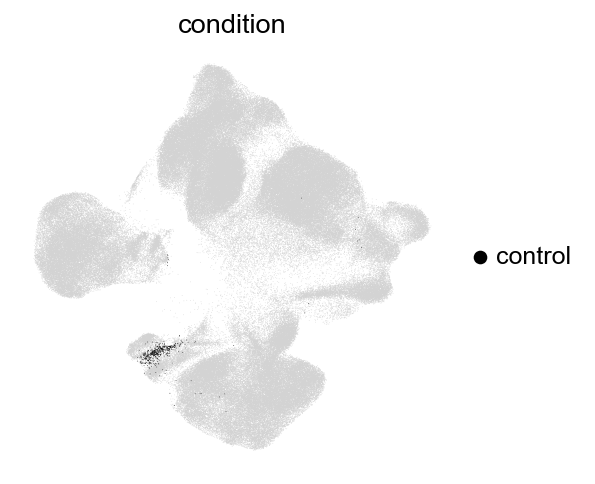

In [400]:
t = temp2[temp2.obs["celltype"].isin(["HSPCs"])]
other = temp2[~temp2.obs["celltype"].isin(must)]
other_c = list(other.obs["condition"].unique())
t.obs_names_make_unique()
other.obs_names_make_unique()
t.obs["condition"].replace(["control","severe COVID-19","moderate COVID-19"],["control","COVID-19","COVID-19"],inplace=True)
other.obs["condition"].replace(other_c,len(other_c)*["other"],inplace=True)
temp3 = other.concatenate(t)
sc.pl.umap(temp3, color="celltype",groups="HSPCs", palette=sc.pl.palettes.vega_10_scanpy,save="_ct_HSPCs_group.pdf")
if "COVID-19" in temp3.obs["condition"].unique():
    sc.pl.umap(temp3, color="condition",groups=["control","COVID-19"],palette=["black","red"],save="_cnd_HSPCs_group_group.pdf")
else:
    sc.pl.umap(temp3, color="condition",groups=["control"],palette=["black","red"],save="_cnd_HSPCs_group_group.pdf")

    

In [324]:
# paga analysis 

In [69]:
adata_new = adata[(adata.obs["celltype"].isin(["Macrophages","Monocytes"]))&(adata.obs["tissue"].isin(["Lung","BALF"]))]

In [70]:
adata_mono = adata_new[adata_new.obs["celltype"] == "Monocytes"]
adata_mac = adata_new[adata_new.obs["celltype"] == "Macrophages"]

In [71]:
adata_mac.obs["condition"].cat.categories

Index(['control', 'moderate COVID-19', 'severe COVID-19'], dtype='object')

In [72]:
adata_mac.obs["condition2"]  = adata_mac.obs["condition"]

Trying to set attribute `.obs` of view, copying.


In [73]:
adata_mac.obs["condition2"].replace(['control', 'moderate COVID-19', 'severe COVID-19'],
                                    ['ctrl_Mac', 'moderate_COVID-19_Mac', 'severe_COVID-19_Mac'],inplace=True)

In [74]:
adata_mono.obs["condition2"] =  adata_mono.obs["celltype"]


Trying to set attribute `.obs` of view, copying.


In [75]:
adata_mono.obs_names_make_unique()
adata_mac.obs_names_make_unique()

In [76]:
adata2 = adata_mono.concatenate(adata_mac)

In [77]:
sc.pp.neighbors(adata2, use_rep="latent")

/home/mohammad/anaconda3/envs/tf/lib/python3.6/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../anaconda3/envs/tf/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


In [361]:
sc.tl.paga(adata2,groups="condition2")

... storing 'donor' as categorical
... storing 'original_celltype_ann' as categorical
... storing 'sample' as categorical
... storing 'ann_level_3' as categorical
... storing 'ann_level_4' as categorical
... storing 'ann_level_5' as categorical
... storing 'study' as categorical
... storing 'study2' as categorical
... storing 'celltype' as categorical
... storing 'condition' as categorical
... storing 'cellnames' as categorical
... storing 'ID' as categorical
... storing 'sample_new' as categorical
... storing 'tissue' as categorical
... storing 'condition2' as categorical


In [78]:
sc.tl.umap(adata2)

In [ ]:
sc.pl.paga(adata2, color=["condition2"], title="",save="_no_filtered.pdf")

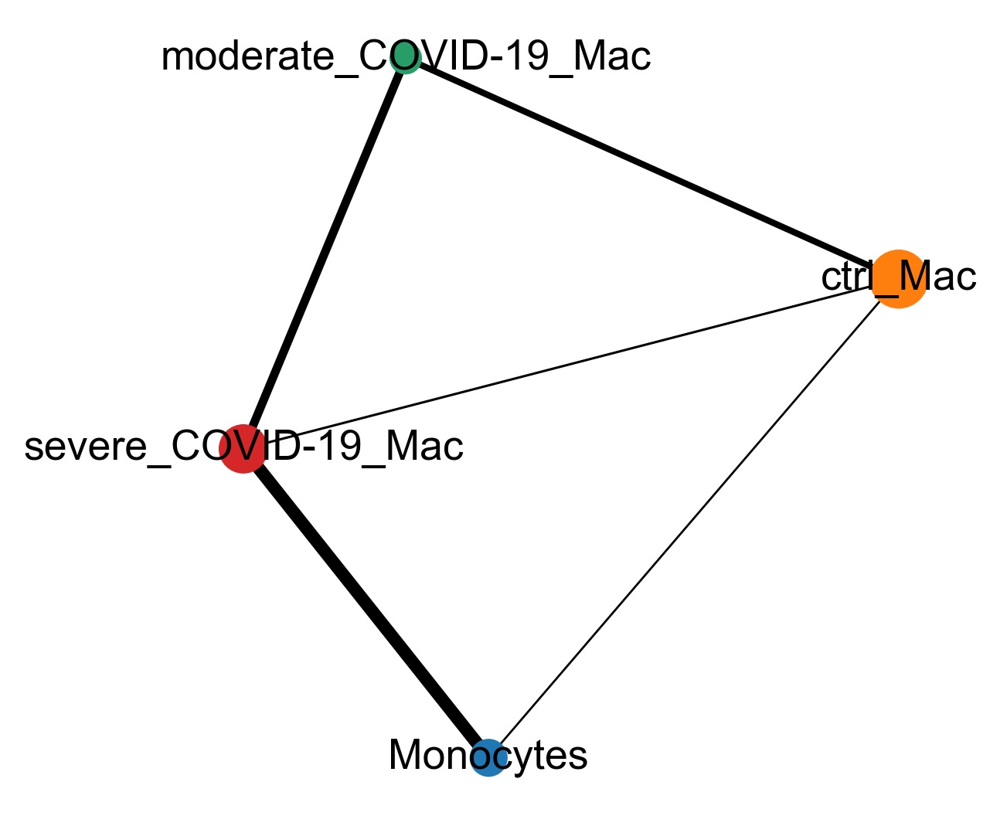

In [364]:
sc.pl.paga(adata2, color=["condition2"], title="",save="_no_thresh.pdf", threshold=0.05)

In [365]:
# Macrhophages

In [401]:
adata_new = adata[adata.obs["celltype"] == "Macrophages"]

Trying to set attribute `.uns` of view, copying.


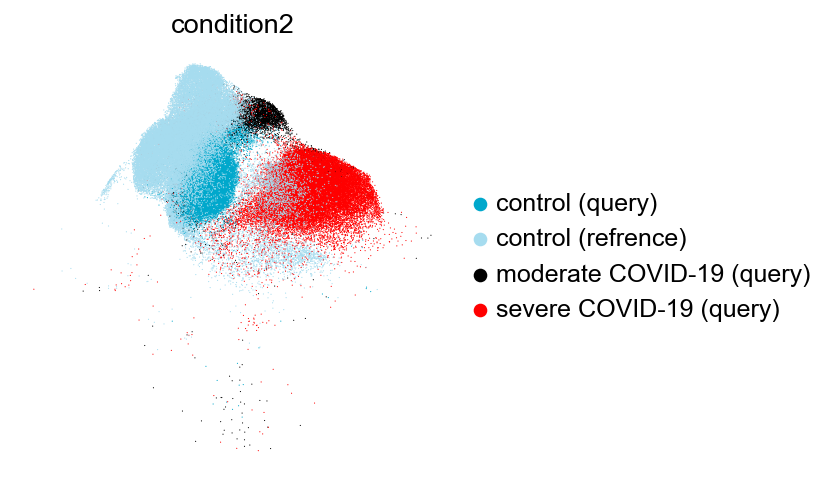

In [402]:
sc.pl.umap(adata_new, color = ["condition2"],palette=["#00a8cc","#a6dcef","black","red"])

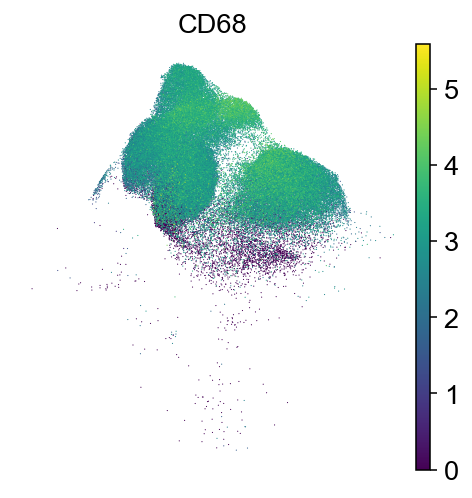

In [403]:
sc.pl.umap(adata_new, color = ["CD68"], use_raw=False, save="CD68.pdf")

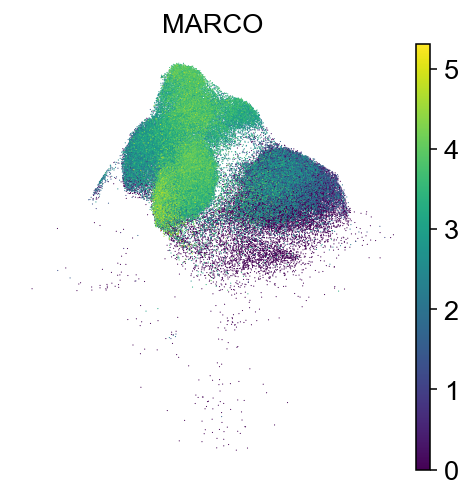

In [404]:
sc.pl.umap(adata_new, color = ["MARCO"], use_raw=False,save="MARCO.pdf")

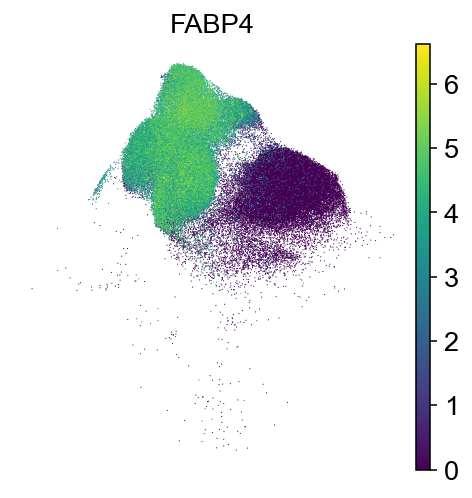

In [405]:
sc.pl.umap(adata_new, color = ["FABP4"],save="Fabp4.pdf")

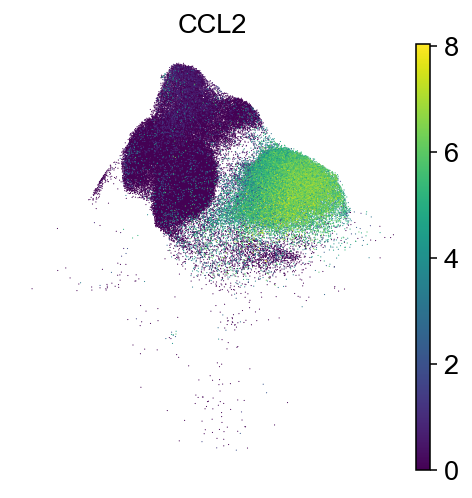

In [406]:
sc.pl.umap(adata_new, color = ["CCL2"], use_raw=False, save="CCL2.pdf")

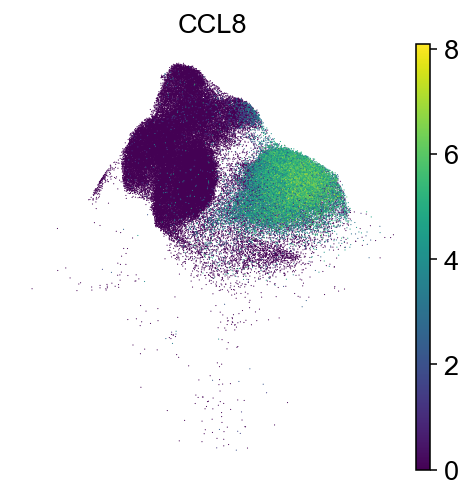

In [407]:
sc.pl.umap(adata_new, color = ["CCL8"], use_raw=False, save="CCL8.pdf")

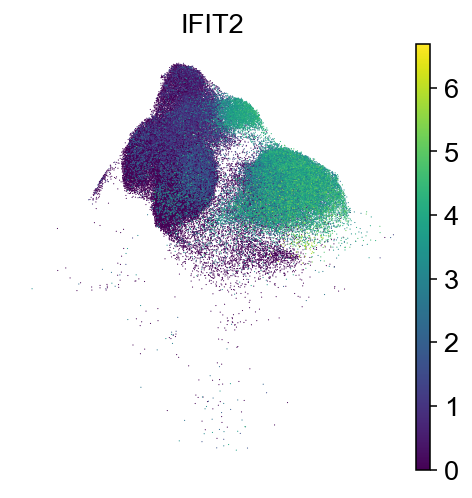

In [408]:
sc.pl.umap(adata_new, color = ["IFIT2"], use_raw=False, save="IFIT2.pdf")

In [409]:
#M2 machropahes

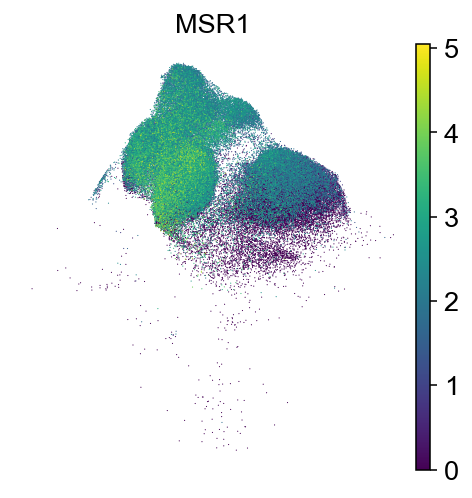

In [410]:
sc.pl.umap(adata_new, color = ["MSR1"], use_raw=False, save="MSR1.pdf")

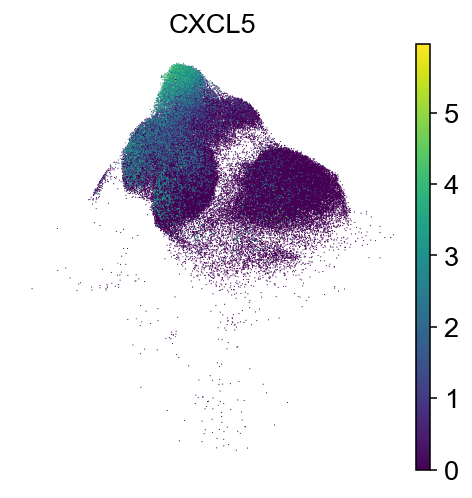

In [411]:
sc.pl.umap(adata_new, color = ["CXCL5"], use_raw=False, save="CXCL5.pdf")


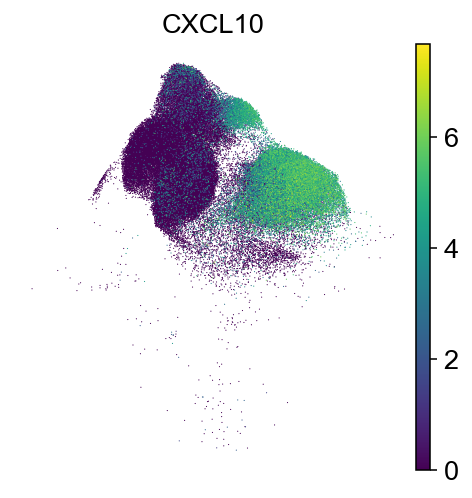

In [412]:
sc.pl.umap(adata_new, color = ["CXCL10"], use_raw=False, save="CXCL10.pdf")


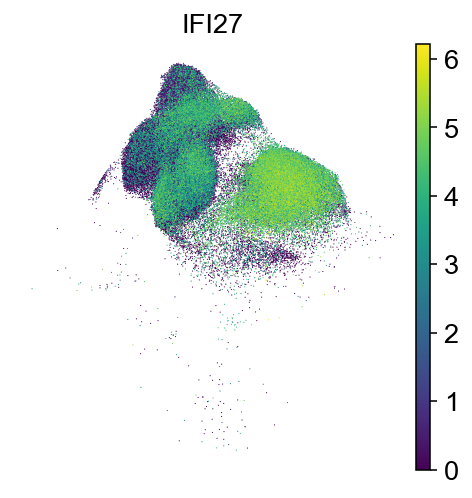

In [413]:
sc.pl.umap(adata_new, color = ["IFI27"], use_raw=False, save="IFI27.pdf")

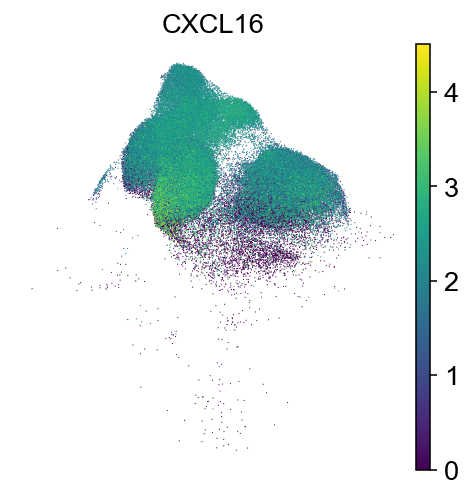

In [414]:
sc.pl.umap(adata_new, color = ["CXCL16"], use_raw=False,save="CCL2.pdf")

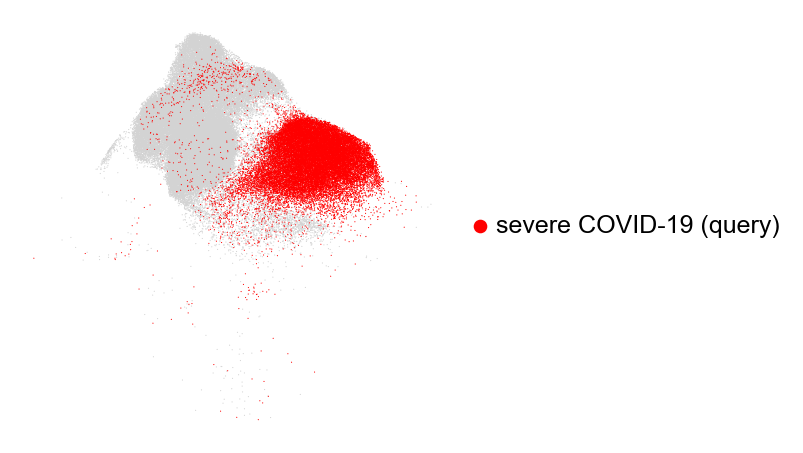

In [415]:
sc.pl.umap(adata_new, color=["condition2"], palette=["#00a8cc","#a6dcef","black","red"],
           save="_mac_sever.pdf", groups=['severe COVID-19 (query)'], title="")

In [416]:
adata_new_query = adata_new[adata_new.obs["study"] != "COVID-19 (query)"]

In [418]:
covid_sever = adata_new[adata_new.obs["condition"] == "severe COVID-19"]

In [419]:
check_donor = adata_new[adata_new.obs["study"] == 'Sanger_Meyer_2019Madissoon']

In [420]:
check_donor.obs_names_make_unique()
covid_sever.obs_names_make_unique()

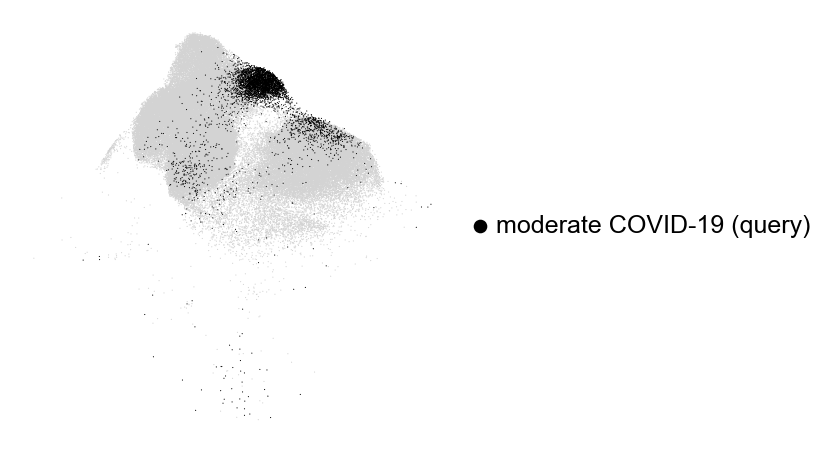

In [421]:
sc.pl.umap(adata_new, color=["condition2"], palette=["#00a8cc","#a6dcef","black","red"],
           save="_mac_moderate.pdf", groups=['moderate COVID-19 (query)'], title="")

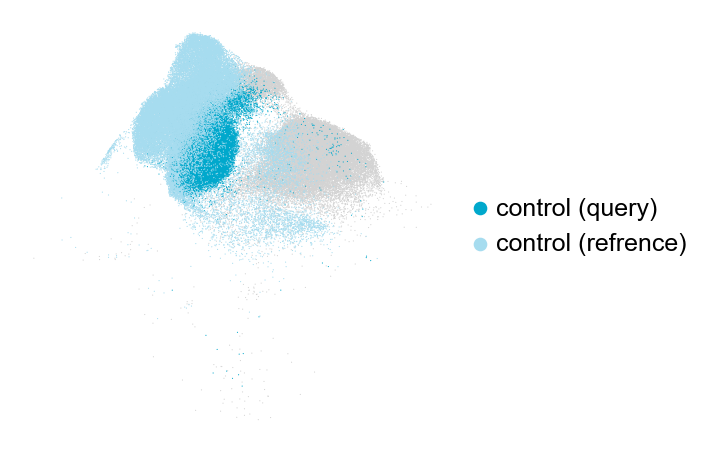

In [422]:
sc.pl.umap(adata_new, color=["condition2"], palette=["#00a8cc","#a6dcef","black","red"],
           save="_mac_ctrl_2.pdf", groups=['control (query)', 'control (refrence)'], title="")

In [423]:
adata_new_krasnow = adata_new[adata_new.obs["study2"] == "Stanford_Krasnow_bioRxivTravaglini"]

Trying to set attribute `.uns` of view, copying.


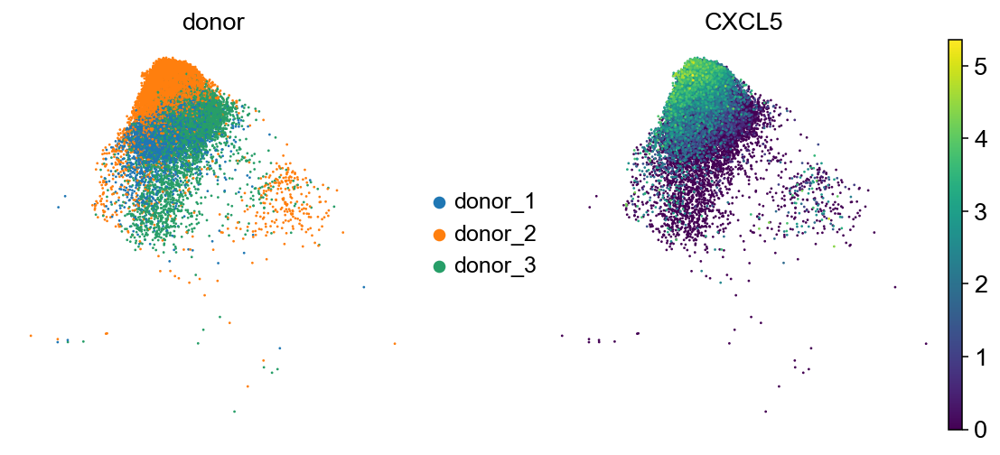

In [424]:
sc.pl.umap(adata_new_krasnow, color = ["donor","CXCL5",], use_raw=False,save="donor2.pdf")

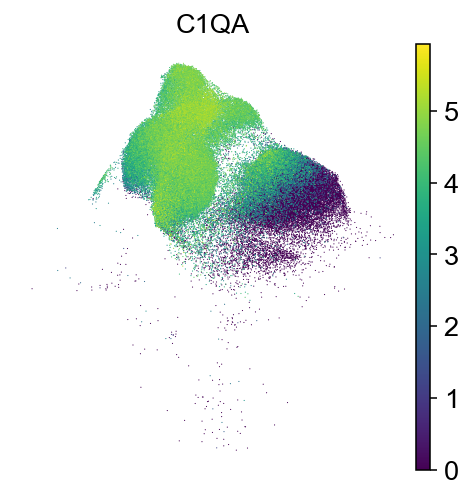

In [425]:
sc.pl.umap(adata_new, color = ["C1QA"], use_raw=False,save="C1Q+.pdf")

In [426]:
# iMMUNE CELLS

In [427]:
adata_new = adata

In [428]:
immune = adata_new[adata_new.obs["celltype"].isin(["CD8+ T cells"])]

In [429]:
immune.obs["celltype"].value_counts()

CD8+ T cells    12891
Name: celltype, dtype: int64

In [430]:
sc.pp.neighbors(immune, use_rep="latent")

/home/mohammad/anaconda3/envs/tf/lib/python3.6/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../anaconda3/envs/tf/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


In [431]:
sc.tl.umap(immune)

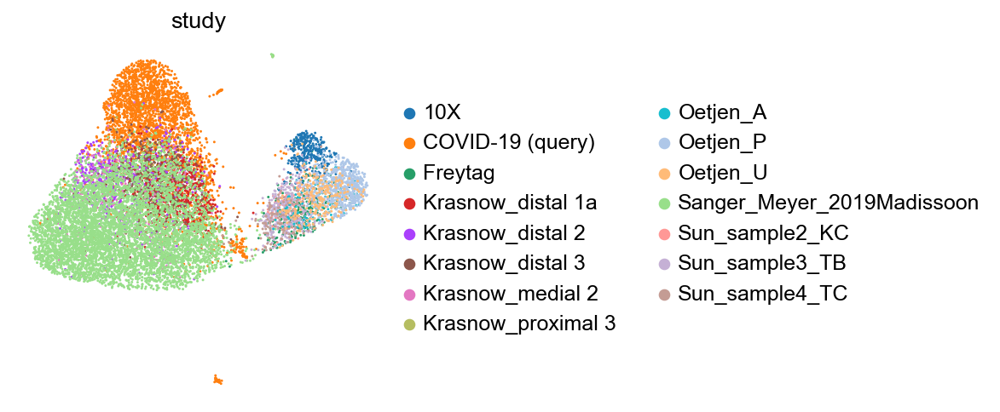

In [432]:
sc.pl.umap(immune, color=["study"],use_raw=False,save="cd8t_study.pdf")

In [433]:
immune.obs["condition"].value_counts()

control              10420
moderate COVID-19     1296
severe COVID-19       1175
Name: condition, dtype: int64

In [434]:
immune.obs["sample"] = immune.obs["tissue"] 

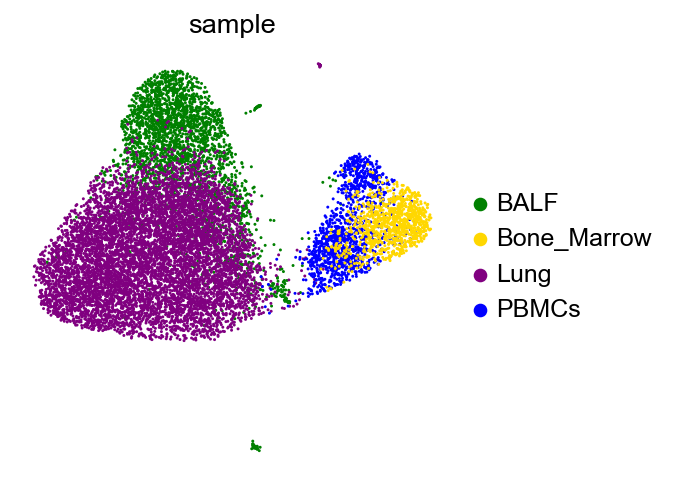

In [435]:
sc.pl.umap(immune, color=["sample"],palette=["green","gold","purple", "blue"],use_raw=False, save="sample_tcell.pdf")

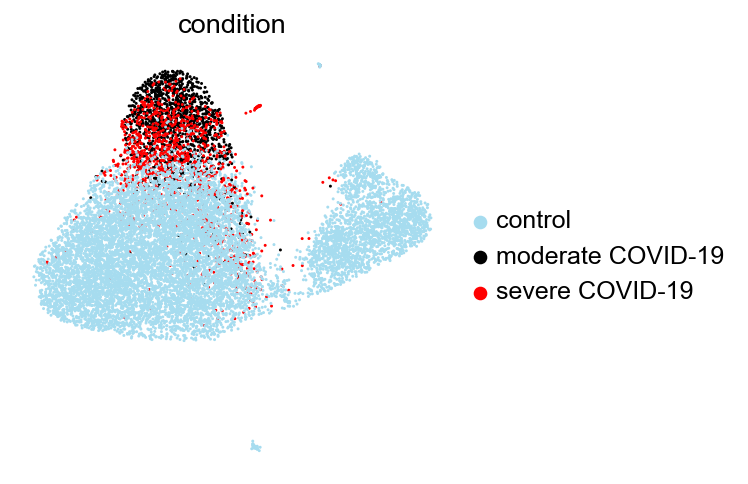

In [436]:
sc.pl.umap(immune, color=["condition"],palette=["#a6dcef","black","red"],
           use_raw=False,save="t_cell_condition.pdf")

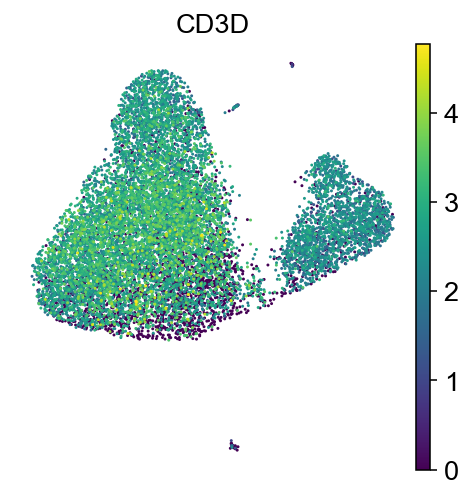

In [437]:
sc.pl.umap(immune, color=["CD3D"],save="genes_t_CD3D.pdf",use_raw=False,)

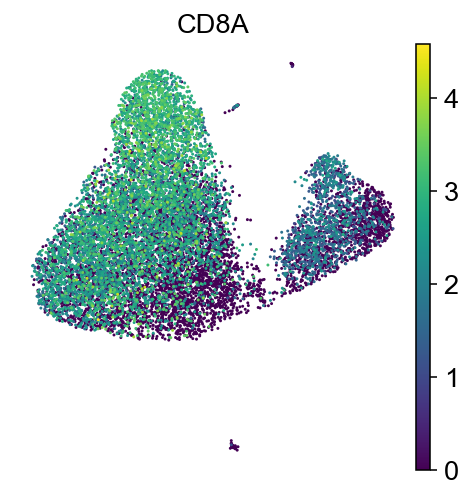

In [438]:
sc.pl.umap(immune, color=["CD8A"],save="genes_t_CD8A.pdf",use_raw=False,)

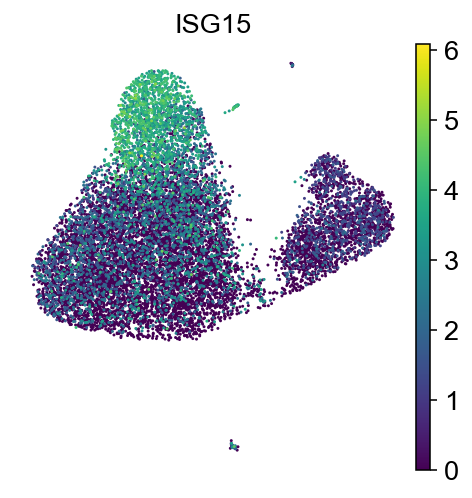

In [439]:
sc.pl.umap(immune, color=["ISG15"],save="genes_t_ISG15.pdf",use_raw=False,)

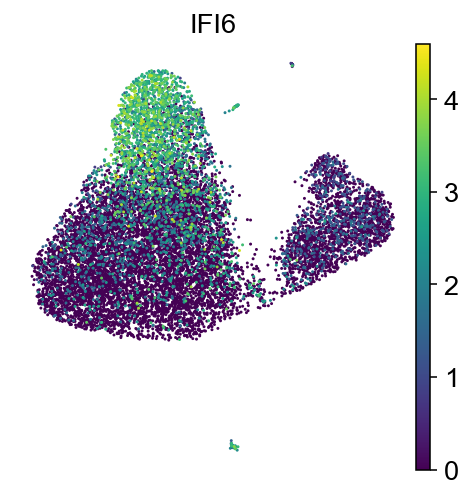

In [440]:
sc.pl.umap(immune, color=["IFI6"],save="genes_t_IFI6.pdf",use_raw=False,)

In [441]:
immune_t_l = immune[immune.obs["sample"].isin(["BALF","Lung"])]

In [442]:
sc.tl.rank_genes_groups(immune_t_l,groupby="sample")

Trying to set attribute `.uns` of view, copying.


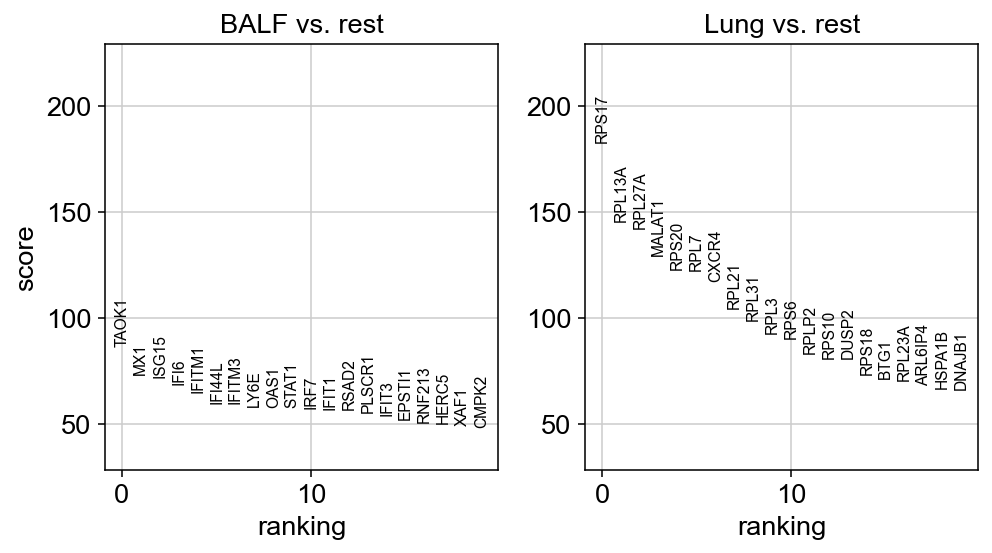

In [443]:
sc.pl.rank_genes_groups(immune_t_l)